# PRCP-1004-Fifa20

FIFA 20 Football is arguably the most popular sport in the world and FIFA is the most popular football (soccer) simulation game by Electronic Arts (EA Sports).
The dataset provided includes the players data for the Career Mode from FIFA 15 to FIFA 20 ("players_20.csv"). The data allows multiple comparisons of the same players across the last 6 versions of the videogame.


Link : https://d3ilbtxij3aepc.cloudfront.net/projects/CDS-Capstone-Projects/PRCP-1004-Fifa20.zip

## Problem Statement

* **Task 1:-** Prepare a complete data analysis report on the given data.
* **Task 2:-** Explore football skills and cluster football players based on their attributes.
* **Task3:-** Explore the data and attempt all the below asked questions in a
step by step manner:
1. Prepare a rank ordered list of top 10 countries with most players. Which
countries are producing the most footballers that play at this level?
2. Plot the distribution of overall rating vs. age of players. Interpret what is the
age after which a player stops improving?
3. Which type of offensive players tends to get paid the most: the striker, the
right-winger, or the left-winger?

In [ ]:
##Import the required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [ ]:
# Reading the dataset to python environment
data=pd.read_csv('players_20.csv')

pd.set_option('display.max.columns',None)
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

The attributes used in the project are:

* **Name:** Name of the player.
* **Age:** Age of the player.
* **Height:** Height of the player in inches (transformed to centimeters in preprocessing).
* **Overall:** General performance quality and value of the player representing the key positional skills and international reputation rated between 1-99.
* **Potential:** Maximum Overall rating expected to be reached by a player in the top of his career rated between 1-99.
* **PreferredFoot:** Right or Left. Label encoder is applied as 0 for left and 1 for right.
* **WeakFoot:** Represents how well a player uses his weak foot (e.g. left for righties) rated between 1 to 5.
* **WorkRate:** Degree of the effort the player puts in terms of attack and defense rated as low, medium and high. This feature is divided into two new features as AttackWorkRate and DefenseWorkRate. Besides, label encoder is applied as 0 for low, 0.5 for medium and 1 for high.
* **Position:** Position of the players on the pitch which determines their roles and responsibilities in the team. Forward positions in the football and FIFA 19 can be grouped as striker (ST: center striker, RS: right striker, LS: left striker), forward (CF: center forward, RF: right forward, LF: left forward) and winger (RW: right winger, LW: left winger).
* **ST: Positional skill.** Player’s general ability when playing in ST position rated between 1-99.
* **RS: Positional skill.** Player’s general ability when playing in in RS position rated between 1-99.
* **LS: Positional skill.** Player’s general ability when playing in in LS position rated between 1-99.
* **CF: Positional skill.** Player’s general ability when playing in in CF position rated between 1-99.
* **RF: Positional skill.** Player’s general ability when playing in in RF position rated between 1-99.
* **LF: Positional skill.** Player’s general ability when playing in in LF position rated between 1-99.
* **RW: Positional skill.** Player’s general ability when playing in in RW position rated between 1-99.
* **LW: Positional skill.** Player’s general ability when playing in in LW position rated between 1-99.
* **Crossing:** Crossing skill of the player rated between 1-99. Cross is a long-range pass from wings to center.
* **Finishing:** Finishing skill of the player rated between 1-99. Finishing in football refers to finish an attack by scoring a goal.
* **HeadingAccuracy:** Player’s accuracy to pass or shoot by using his head rated between 1-99.
* **ShortPassing:** Player’s accuracy for short passes rated between 1-99.
* **LongPassing:** Player’s accuracy for long passes rated between 1-99.
* **Dribbling:** Dribbling skill of the player rated between 1-99. Dribbling is carrying the ball without losing while moving in one particular direction.
* **SprintSpeed:** Speed rate of the player rated between 1-99.
* **Acceleration:** Shows how fast a player can reach his maximum sprint speed rated between 1-99.
* **FKAccuracy:** Player’s accuracy to score free kick goals rated between 1-99.
* **BallControl:** Player’s ability to control the ball rated between 1-99.
* **Balance:** Player’s ability to remain steady while running, carrying and controlling the ball rated between 1-99.
* **ShotPower:** Player’s strength level of shooting the ball rated between 1-99.
* **Jumping:** Player’s jumping skill rated between 1-99.
* **Penalties:** Player’s accuracy to score goals from penalty rated between 1-99.
* **Strength:** Physical strength of the player rated between 1-99.
* **Agility:** Gracefulness and quickness of the player while controlling the ball rated between 1-99.
* **Reactions:** Acting speed of the player to what happens in his environment rated between 1-99.
* **Aggression:** Aggression level of the player while pushing, pulling and tackling rated between 1-99.
* **Positioning:** Player’s ability to place himself in the right position to receive the ball or score goals rated between 1-99.
* **Vision:** Player’s mental awareness about the other players in the team for passing rated between 1-99.
* **Volleys:** Player’s ability to perform volleys rated between 1-99.
* **LongShots:** Player’s accuracy of shoots from long distances rated between 1-99.
* **Stamina:** Player’s ability to sustain his stamina level during the match rated between 1-99. Players with lower stamina get tired fast.
* **Composure:** Player’s ability to control his calmness and frustration during the match rated between 1-99.
* **Curve:** Player’s ability to curve the ball while passing or shooting rated between 1-99.
* **Interceptions:** Player’s ability to intercept the ball while opposite team’s players are passing rated between 1-99. It is a defensive skill.
* **StandingTackle:** Player’s ability to perform tackle (take the ball from the opposite player) while standing rated between 1-99. It is a defensive skill.
* **SlidingTackle:** Player’s ability to perform tackle by sliding rated between 1-99. It is a defensive skill.
* **Marking:** Player’s ability to apply strategies to prevent opposing team from taking the ball rated between 1-99. It is a defensive skill.  

# Task 1 - Prepare a complete data analysis report on the given data

## Basic Checks

In [ ]:
data.shape

(18278, 104)

 Dataset has 18278 rows and 104 columns/features with both numerical and categorical features

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


**Float columns**:16 columns<br>
**Integer columns**:45 columns<br>
**Object columns**:43 columns<br>

In [ ]:
int_cols=data.select_dtypes('int').columns
print(data[int_cols].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 45 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   sofifa_id                   18278 non-null  int64
 1   age                         18278 non-null  int64
 2   height_cm                   18278 non-null  int64
 3   weight_kg                   18278 non-null  int64
 4   overall                     18278 non-null  int64
 5   potential                   18278 non-null  int64
 6   value_eur                   18278 non-null  int64
 7   wage_eur                    18278 non-null  int64
 8   international_reputation    18278 non-null  int64
 9   weak_foot                   18278 non-null  int64
 10  skill_moves                 18278 non-null  int64
 11  attacking_crossing          18278 non-null  int64
 12  attacking_finishing         18278 non-null  int64
 13  attacking_heading_accuracy  18278 non-null  int64
 14  attack

In [ ]:
cat_cols=data.select_dtypes('object').columns
print(data[cat_cols].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 43 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   player_url        18278 non-null  object
 1   short_name        18278 non-null  object
 2   long_name         18278 non-null  object
 3   dob               18278 non-null  object
 4   nationality       18278 non-null  object
 5   club              18278 non-null  object
 6   player_positions  18278 non-null  object
 7   preferred_foot    18278 non-null  object
 8   work_rate         18278 non-null  object
 9   body_type         18278 non-null  object
 10  real_face         18278 non-null  object
 11  player_tags       1499 non-null   object
 12  team_position     18038 non-null  object
 13  loaned_from       1048 non-null   object
 14  joined            16990 non-null  object
 15  nation_position   1126 non-null   object
 16  player_traits     7566 non-null   object
 17  ls          

In [ ]:
float_cols=data.select_dtypes('float').columns
print(data[float_cols].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   release_clause_eur    16980 non-null  float64
 1   team_jersey_number    18038 non-null  float64
 2   contract_valid_until  18038 non-null  float64
 3   nation_jersey_number  1126 non-null   float64
 4   pace                  16242 non-null  float64
 5   shooting              16242 non-null  float64
 6   passing               16242 non-null  float64
 7   dribbling             16242 non-null  float64
 8   defending             16242 non-null  float64
 9   physic                16242 non-null  float64
 10  gk_diving             2036 non-null   float64
 11  gk_handling           2036 non-null   float64
 12  gk_kicking            2036 non-null   float64
 13  gk_reflexes           2036 non-null   float64
 14  gk_speed              2036 non-null   float64
 15  gk_positioning     

In [ ]:
# Statistical summary
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.

In [ ]:
data.describe(include='O')

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,real_face,player_tags,team_position,loaned_from,joined,nation_position,player_traits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,1499,18038,1048,16990,1126,7566,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,2,83,29,316,1760,26,921,94,94,94,107,103,103,103,107,103,103,103,100,88,88,88,100,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,No,#Strength,SUB,Sassuolo,2019-07-01,SUB,Early Crosser,61+2,61+2,61+2,63+2,63+2,63+2,63+2,63+2,61+2,61+2,61+2,61+2,58+2,58+2,58+2,61+2,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,16310,514,7820,17,1465,587,501,725,725,725,736,727,727,727,736,748,748,748,809,775,775,775,809,682,636,636,636,682,667,621,621,621,667


In [ ]:
# Check for missing values
missing_values = data.isnull().sum()
percentage_missing = (missing_values / len(data)) * 100

# Display columns with missing values and their percentage
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': percentage_missing})
missing_data = missing_data[missing_data['Missing Values'] > 0]
print(missing_data)

                      Missing Values  Percentage
release_clause_eur              1298    7.101433
player_tags                    16779   91.798884
team_position                    240    1.313054
team_jersey_number               240    1.313054
loaned_from                    17230   94.266331
joined                          1288    7.046723
contract_valid_until             240    1.313054
nation_position                17152   93.839589
nation_jersey_number           17152   93.839589
pace                            2036   11.139074
shooting                        2036   11.139074
passing                         2036   11.139074
dribbling                       2036   11.139074
defending                       2036   11.139074
physic                          2036   11.139074
gk_diving                      16242   88.860926
gk_handling                    16242   88.860926
gk_kicking                     16242   88.860926
gk_reflexes                    16242   88.860926
gk_speed            

In [ ]:
# Checking columns with more than 50% missing values
miss_cols = data.isna().mean() * 100
drop_cols=list(miss_cols[miss_cols.values >50].index)
drop_cols

['player_tags',
 'loaned_from',
 'nation_position',
 'nation_jersey_number',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'player_traits']

In [ ]:
#From the above datasets player_tags,loaned_from and nation_jersey_number does not contain critical information
#that is necessary for the analysis. So removing the column may be less impactful.
data.drop(['player_tags','loaned_from','nation_jersey_number','nation_position','gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning'],axis=1,inplace=True)


In [ ]:
#Drop some of the features which may be less impactful
data.drop(['sofifa_id', 'player_url','long_name','dob',
          'team_jersey_number','joined','contract_valid_until'],axis=1,inplace=True)

In [ ]:
# Check for duplicate rows
duplicate_rows = data[data.duplicated()]
print("Number of duplicate rows:", len(duplicate_rows))

Number of duplicate rows: 0


# Convert the object type features to numerical values

In [ ]:
cols=['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm',
                'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']

In [ ]:
def split_and_sum(value):
    if pd.notna(value):
        parts = value.split('+')
        return int(parts[0]) + int(parts[1])
    else:
        return np.nan

In [ ]:
data[cols]=data[cols].applymap(split_and_sum)

In [ ]:


# Calculate the minimum value for each column
column_mins = data.min(numeric_only=True)

# Find columns where the minimum value is equal to 0
columns_with_min_zero = column_mins[column_mins == 0]

# Display the columns with a minimum value of 0
print(columns_with_min_zero)

value_eur    0.0
wage_eur     0.0
dtype: float64


In [ ]:
columns_with_missing = data.columns[data.isnull().any()]

# Create a new DataFrame with only the selected columns
new_df = data[columns_with_missing]
new_df.columns

Index(['release_clause_eur', 'team_position', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'player_traits', 'ls', 'st', 'rs',
       'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm',
       'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb',
       'rcb', 'rb'],
      dtype='object')

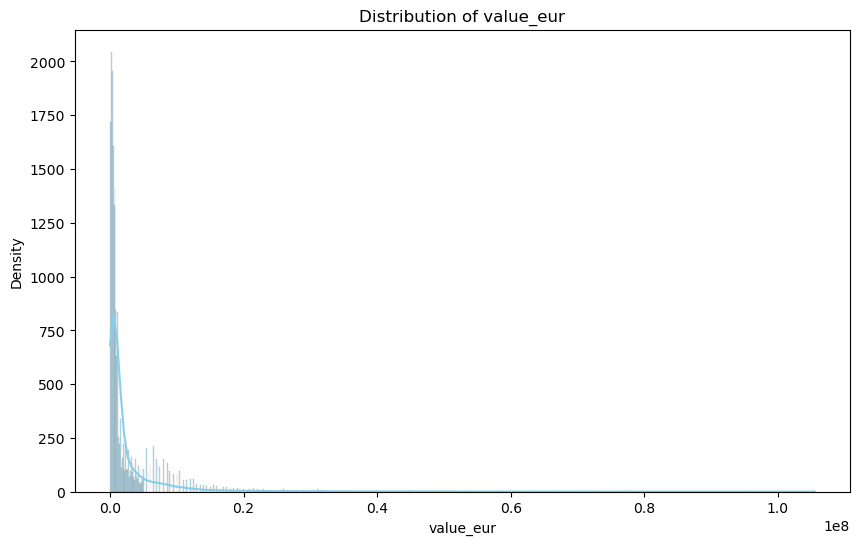

In [ ]:
# Assuming 'data' is your DataFrame with the 'value_eur' column
plt.figure(figsize=(10, 6))
sns.histplot(data['value_eur'], kde=True, color='skyblue')
plt.title('Distribution of value_eur')
plt.xlabel('value_eur')
plt.ylabel('Density')
plt.show()

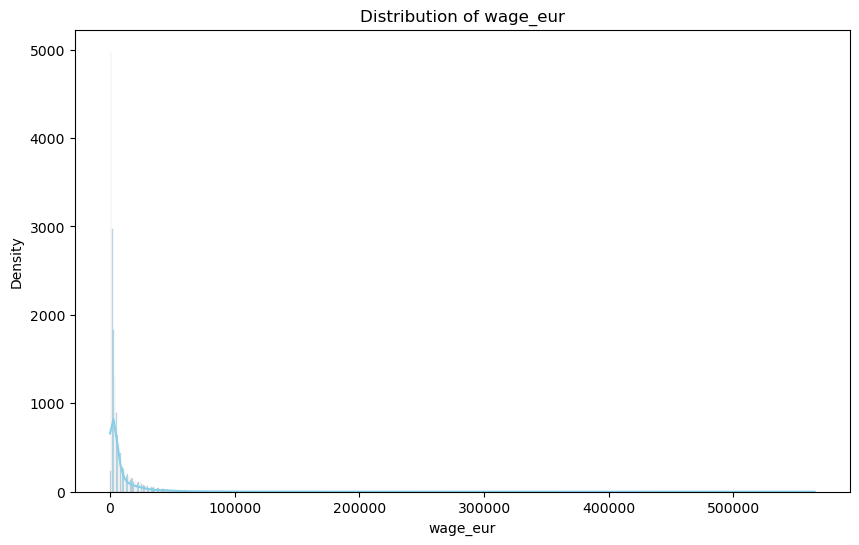

In [ ]:
# Assuming 'data' is your DataFrame with the 'value_eur' column
plt.figure(figsize=(10, 6))
sns.histplot(data['wage_eur'], kde=True, color='skyblue')
plt.title('Distribution of wage_eur')
plt.xlabel('wage_eur')
plt.ylabel('Density')
plt.show()

# CHECKING FOR DISTRIBUTION OF COLUMNS

In [ ]:
from scipy import stats


# Assuming you have a DataFrame named df
# Select only the numeric columns from the DataFrame
numeric_df = new_df.select_dtypes(include=['float64', 'int64'])

# Perform the Anderson-Darling test on each numeric column
for column in numeric_df.columns:
    result = stats.anderson(numeric_df[column].dropna())
    print(f"Column: {column}")
    print("Test Statistic:", result.statistic)
    print("Critical Values:", result.critical_values)
    print("Significance Levels:", result.significance_level)
    if result.statistic < result.critical_values[2]:
        print("The data appears to be normally distributed.")
    else:
        print("The data does not appear to be normally distributed.")
    print("\n")

Column: release_clause_eur
Test Statistic: 3079.0393569631888
Critical Values: [0.576 0.656 0.787 0.918 1.092]
Significance Levels: [15.  10.   5.   2.5  1. ]
The data does not appear to be normally distributed.


Column: pace
Test Statistic: 70.50675698440682
Critical Values: [0.576 0.656 0.787 0.918 1.092]
Significance Levels: [15.  10.   5.   2.5  1. ]
The data does not appear to be normally distributed.


Column: shooting
Test Statistic: 132.96971404400756
Critical Values: [0.576 0.656 0.787 0.918 1.092]
Significance Levels: [15.  10.   5.   2.5  1. ]
The data does not appear to be normally distributed.


Column: passing
Test Statistic: 29.059818665733474
Critical Values: [0.576 0.656 0.787 0.918 1.092]
Significance Levels: [15.  10.   5.   2.5  1. ]
The data does not appear to be normally distributed.


Column: dribbling
Test Statistic: 125.72459007829457
Critical Values: [0.576 0.656 0.787 0.918 1.092]
Significance Levels: [15.  10.   5.   2.5  1. ]
The data does not appear to be

# MISSING VALUE IMPUTATION

In [ ]:
#From above result apply median for missing datasets
for col in numeric_df:
    data[col].fillna(data[col].median(), inplace=True)



In [ ]:
#Again checking the missing value columns
columns_with_missing = data.columns[data.isnull().any()]

# Create a new DataFrame with only the selected columns
new_df = data[columns_with_missing]
new_df.columns

Index(['team_position', 'player_traits'], dtype='object')

In [ ]:
categorical_features_df = new_df.select_dtypes(include=['object']).columns.tolist()
categorical_features_df

['team_position', 'player_traits']

In [ ]:
#Fill the missing values for categorical data

for col in categorical_features_df:
    #if len(data[col].value_counts()) <= 150:
    data[col].fillna(data[col].mode()[0], inplace=True)

In [ ]:
# Get a list of all categorical features
categorical_features = data.select_dtypes(include=['object']).columns.tolist()
categorical_features

['short_name',
 'nationality',
 'club',
 'player_positions',
 'preferred_foot',
 'work_rate',
 'body_type',
 'real_face',
 'team_position',
 'player_traits']

In [ ]:
# Get a list of all Numerical features
numerical_features = data.select_dtypes(include=['int']).columns.tolist()
numerical_features

['age',
 'height_cm',
 'weight_kg',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_reactions',
 'movement_balance',
 'power_shot_power',
 'power_jumping',
 'power_stamina',
 'power_strength',
 'power_long_shots',
 'mentality_aggression',
 'mentality_interceptions',
 'mentality_positioning',
 'mentality_vision',
 'mentality_penalties',
 'mentality_composure',
 'defending_marking',
 'defending_standing_tackle',
 'defending_sliding_tackle',
 'goalkeeping_diving',
 'goalkeeping_handling',
 'goalkeeping_kicking',
 'goalkeeping_positioning',
 'goalkeeping_reflexes']

In [ ]:
# Get a list of all Float features
float_features = data.select_dtypes(include=['float']).columns.tolist()
float_features

['release_clause_eur',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'ls',
 'st',
 'rs',
 'lw',
 'lf',
 'cf',
 'rf',
 'rw',
 'lam',
 'cam',
 'ram',
 'lm',
 'lcm',
 'cm',
 'rcm',
 'rm',
 'lwb',
 'ldm',
 'cdm',
 'rdm',
 'rwb',
 'lb',
 'lcb',
 'cb',
 'rcb',
 'rb']

## EDA

In [ ]:
#Univariate Analysis
import sweetviz as sv

In [ ]:
my_report = sv.analyze(data)
my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"


                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


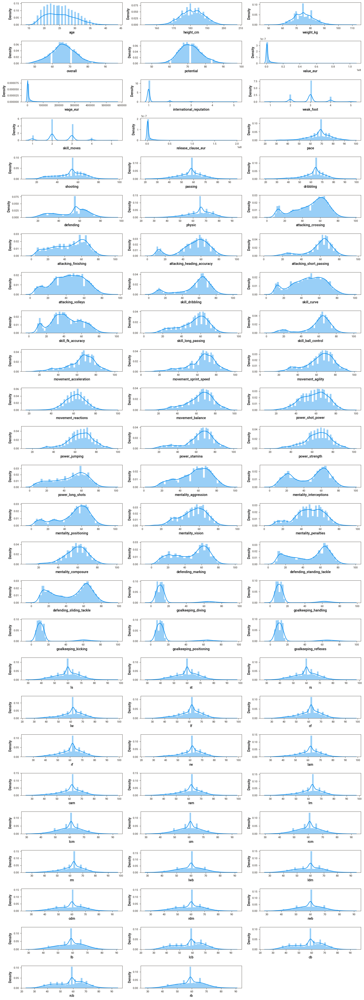

In [ ]:
num_cols=data.select_dtypes(include=["float64","int64"])
plt.figure(figsize=(15,50))
num=1
for i in num_cols:
    if num<=94:
        plt.subplot(32,3,num)
        sns.distplot(x=data[i])
        plt.xlabel(i)
    num+=1
plt.tight_layout()

### Insights
* **Age**: Age of players lies between 15 to 40
* **Height**:Most of player's height lies between 170 cm to 200 cm
* **Weight**:Most of player's weight ranges from 60kg to 90kg
* **Overall**:Overall performance ratings for each player ranges from 50 to 90
* **Value_EUR**:Maximum value of player is 105.5 million. 95% of players has value 10.5 million
* **Wage_EUR:** Maximum wage of player is 526k.95% of players has wage 38k.
* **International Reputation:** less than 1% of players has 5 rating. 92% players has 1 rating
* **release clause EUR:** The maximum release clause of player is 195.8 million The Average release clause of player is 4.7 million
* **Pace:** The most of the pace of player between 60 to 80.
* **passing:** The range of passing score of the player is 24 to 92 with the average 57.2.
* **dribbling:** The most no of dribbling score between 50 to 80.
* **defending:** The Most no of defending score between 50 to 70.
* **physic:** The most no of physcore between 60 to 80
* **Attacking crossing:** The most observation of attacking passing between 50 to 70
* **Attacking Finishing:** Most of the attacking finishing is 60,Maximum 95 and minimum 2 attacking finishing.
* **Attacking heading accuracy:** Most observation of attacking heading accuracy between 50 to 60
* **Attacking Shot passing:** Most observation of attacking short passing between 60 to 70
* **Attacking Volleys:** Most observation of attacking volleys between 30 to 70.
* **Skill Dribbling:** most observation of skill dribbling is 65. The range of skill dribbling between 4 to 97
* **Skill Accuracy:** The most observation of skill curve between 40 to 70, maximum score is 94 and minimum score is 6
* **Skill FK Accuracy:** The maximum accuracy is 94 and minimum accuracy is 4 with the average of 42.7
* **Skill long passing:** The most observation of skill long passing between 50 to 60, maximum score is 92 and minimum score is 8
* **skill ball control:** The maximum skill ball control is 96 and minimum skill ball control is 5 with the average of 58.5
* **Movement acceleration:** The most observation of movement acceleration between 60 to 80, maximum score is 97 and minimum score is 12
* **Movement sprint speed:** Maximum sprint speed is 96 and minimum sprint speed is 11 with the average of 64.4
* **Movement Agility:** Maximum movement agility is 96 and minimum movement agility is 11 with the average of 63.5
* **Movement Reaction:** Maximum movement reaction is 96 and minimum movement reaction is 21 with the average of 61.8
* **Movement Balance:** The range of movement balance is 12 to 97 with 64.9 average.
* **Power shot power:** Maximum shot power is 95 and minimum shot power is 14 with the average of 58.2
* **Power jumping:** Maximum power jumping is 95 and minimum power jumping is 19 with the average of 64.9
* **Power Stamina:** Maximum power stamina is 97 and minimum shot stamina is 12 with the average of 62.9
* **Power strength:** Maximum power strength is 97 and minimum power strength is 20 with the average of 65.2
* **Power long shot:** Maximum power long shot is 94 and minimum power long shot is 4 with the average of 46.8
* **Mentality aggression:** Maximum mentality aggression is 95 and minimum mentality aggression is 9 with the average of 55.7
* **Mentality interception:** Maximum mentality interception is 93 and minimum mentality interception is 3 with the average of 46.3
* **Metality Positioning:** Maximum mentality positioning is 95 and minimum mentality positioning is 2 with the average of 50.1
* **Mentality Vision:** Maximum mentality vision is 94 and minimum mentality vision is 9 with the average of 53.6
* **Mentality Penalities:** Maximum mentality penalties is 92 and minimum mentality penalties is 7 with the average of 48.7
* **Mentality Composer:** Maximum mentality composure is 96 and minimum mentality composure is 12 with the average of 58.5
* **Defending Marking:** Maximum defending marking is 94 and minimum defending marking is 1 with the average of 46.8
* **Defending standing tackle:** Maximum defending standing tackle is 92 and minimum defending standing tackle is 5 with the average of 47.6
* **Defending sliding tackle:** Maximum defending sliding tackle is 90 and minimum defending sliding tackle is 3 with the average of 45.6
* **Goalkeeping diving:** Maximum goalkeeping diving is 90 and minimum goalkeeping diving is 1 with the average of 16.6
* **Goalkeeping Handling:** Maximum goalkeeping handling is 92 and minimum goalkeeping diving is 1 with the average of 16.4
* **Goalkeeping kicking :** Maximum goalkeeping kicking is 91 and minimum goalkeeping diving is 1 with the average of 16.4
* **Goalkeeping Reflex:** Maximum goalkeeping Reflex is 92 and minimum goalkeeping diving is 1 with the average of 16.7



## Task3:-
<h3>A) Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?
    </h3>


In [ ]:
data.columns

Index(['short_name', 'age', 'height_cm', 'weight_kg', 'nationality', 'club',
       'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'work_rate', 'body_type', 'real_face',
       'release_clause_eur', 'team_position', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'player_traits',
       'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision'

In [ ]:
data.duplicated().sum()

0

In [ ]:
# Count the number of players from each nationality
player_counts = data['nationality'].value_counts()
# Select the top 10 countries with the most players
top_10_countries = player_counts.head(10)
top_10_countries
# Print the rank-ordered list
print("Top 10 Countries with the Most Players:")
print(top_10_countries)

Top 10 Countries with the Most Players:
England        1667
Germany        1216
Spain          1035
France          984
Argentina       886
Brazil          824
Italy           732
Colombia        591
Japan           453
Netherlands     416
Name: nationality, dtype: int64


In [ ]:
# Extract the names of the top 10 countries
top_10_country_names = top_10_countries.index.tolist()

# Now, you can print the names of the top 10 countries
print("Top 10 Countries Producing the Most Footballers:")
print(top_10_country_names)

Top 10 Countries Producing the Most Footballers:
['England', 'Germany', 'Spain', 'France', 'Argentina', 'Brazil', 'Italy', 'Colombia', 'Japan', 'Netherlands']


<u><h3>Visualization</h3></u>

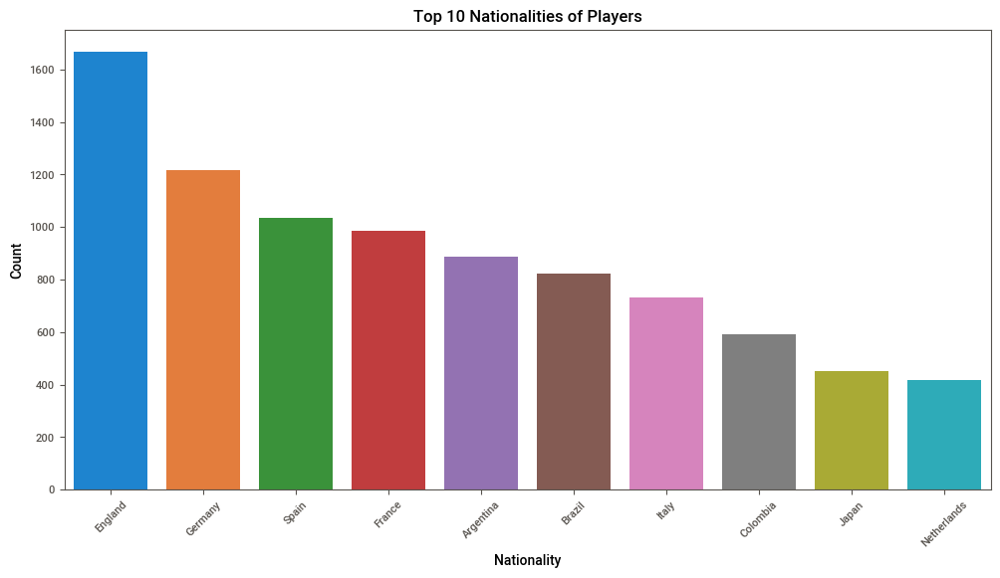

In [ ]:
# Plot for 'nationality' (Top 10 nationalities)
top_10_nationalities = data['nationality'].value_counts().head(10).index
plt.figure(figsize=(12, 6))
sns.countplot(data=data[data['nationality'].isin(top_10_nationalities)], x='nationality',
              order=top_10_nationalities)
plt.title('Top 10 Nationalities of Players')
plt.xlabel('Nationality')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

<h3>B) Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?
</h3>

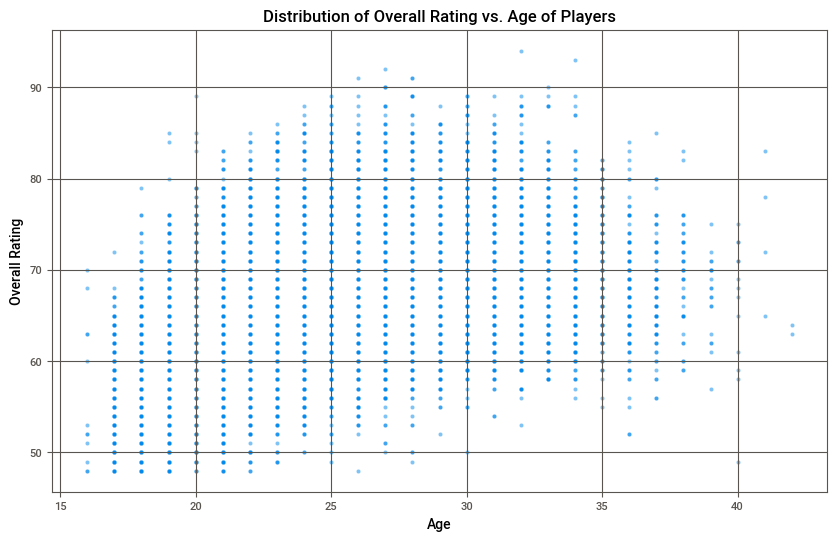

In [ ]:
# Create a scatter plot or line plot (depending on your preference)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='overall', data=data, alpha=0.5)
# You can use sns.lineplot instead of sns.scatterplot for a line plot

# Add labels and title
plt.xlabel('Age')
plt.ylabel('Overall Rating')
plt.title('Distribution of Overall Rating vs. Age of Players')

# Show the plot
plt.grid(True)
plt.show()

<h5>Interpretation:</h5>

The younger players (e.g., teenagers) may have lower overall ratings but have the potential to improve.</br>
As players mature and gain experience (usually up to their mid-20s), their overall ratings tend to increase. This is the age range during which players often show improvement in their skills, physical attributes, and performance.</br>
After a certain age (usually in the late 20s or early 30s), you may notice a plateau or a gradual decline in overall ratings. This suggests that players tend to reach their peak performance during this age range, and improvement becomes less likely.</br>
The specific age after which a player stops improving can vary widely among individuals and depends on factors such as talent, training, injuries, and playing style. Some players may continue to perform at a high level well into their 30s, while others may experience a decline earlier.

<h3>C)
Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?

</h3>

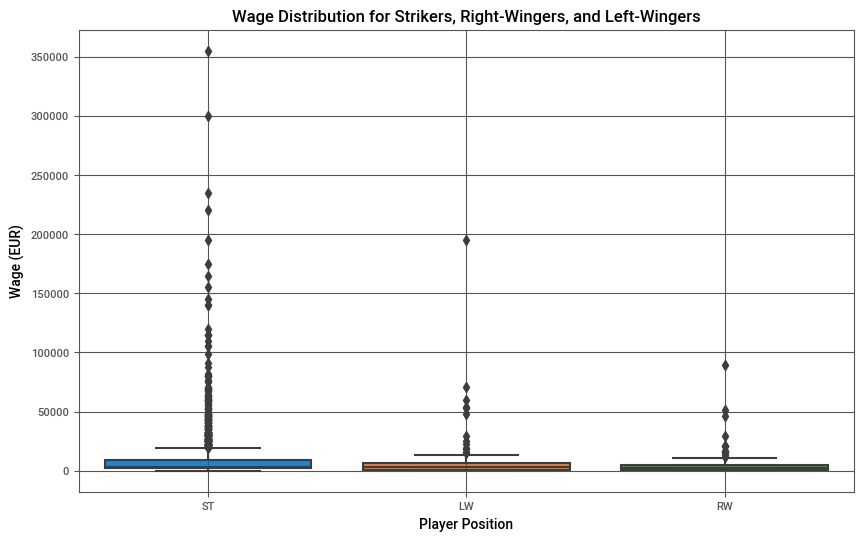

In [ ]:
# Filter the dataset for the specified positions (striker, right-winger, and left-winger)
offensive_positions = ['ST', 'RW', 'LW']
filtered_data = data[data['player_positions'].isin(offensive_positions)]

# Create a box plot to visualize the distribution of wages for each position
plt.figure(figsize=(10, 6))
sns.boxplot(x='player_positions', y='wage_eur', data=filtered_data)
plt.xlabel('Player Position')
plt.ylabel('Wage (EUR)')
plt.title('Wage Distribution for Strikers, Right-Wingers, and Left-Wingers')
plt.grid(True)
plt.show()

In [ ]:
# Group the data by player position
grouped_data = filtered_data.groupby('player_positions')

# Calculate the IQR and potential outliers for each position
position_iqr = {}
position_outliers = {}

for position, group in grouped_data:
    wages = group['wage_eur']

    # Calculate the IQR
    q1 = np.percentile(wages, 25)
    q3 = np.percentile(wages, 75)
    iqr = q3 - q1
    position_iqr[position] = iqr

    # Identify potential outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = group[(wages < lower_bound) | (wages > upper_bound)]
    position_outliers[position] = outliers

# Print the IQR for each position
print("Interquartile Ranges (IQR) for Each Position:")
for position, iqr in position_iqr.items():
    print(f"{position}: {iqr}")

# Print potential outliers for each position
print("\nPotential Outliers for Each Position:")
for position, outliers in position_outliers.items():
    print(f"{position}: {outliers.shape[0]} potential outliers")

Interquartile Ranges (IQR) for Each Position:
LW: 5250.0
RW: 4000.0
ST: 7000.0

Potential Outliers for Each Position:
LW: 13 potential outliers
RW: 13 potential outliers
ST: 248 potential outliers


In [ ]:
#Let's do some statistical test analysis
from scipy.stats import f_oneway


# Group the data by player position
grouped_data = [group['wage_eur'] for _, group in filtered_data.groupby('player_positions')]

# Perform ANOVA test
f_statistic, p_value = f_oneway(*grouped_data)

# Define the significance level (alpha)
alpha = 0.05

# Interpret the results
if p_value < alpha:
    print("There is a statistically significant difference in wages among offensive player positions.")
else:
    print("There is no statistically significant difference in wages among offensive player positions.")


There is no statistically significant difference in wages among offensive player positions.


<h5>Interpretation:</h5>

Strikers (ST) have the highest IQR of 7000.0, indicating a wider range of wages among strikers. This means that there is more variability in the wages of strikers compared to the other positions.
</br>
Left-Wingers (LW) have an IQR of 5250.0, which is also substantial but lower than that of strikers.
</br>
Right-Wingers (RW) have the smallest IQR of 4000.0, indicating relatively less variability in wages among right-wingers.
</br>
Strikers have a significantly higher number of potential outliers (248) compared to left-wingers (13) and right-wingers (13). This suggests that there are more players in the striker position with exceptionally high or low wages.
</br>
Based on the ANOVA test result, there is no significant difference in wages among offensive player positions

<h4>Numerical Attributes Analysis</h4>


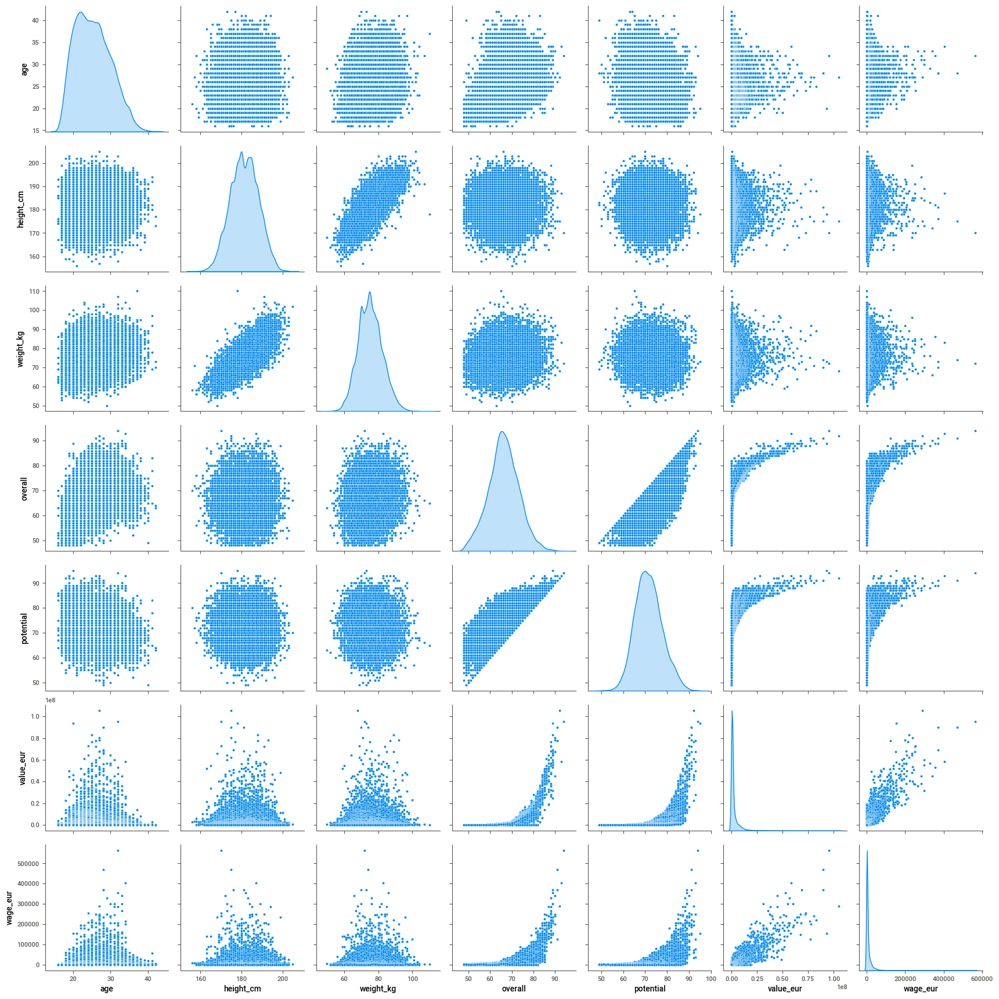

In [ ]:

# Select a subset of numerical attributes for analysis
numerical_attributes = data.loc[:,['age', 'height_cm', 'weight_kg', 'overall', 'potential', 'value_eur', 'wage_eur']]

# Create pair plots for selected numerical attributes
sns.pairplot(data=numerical_attributes, diag_kind='kde')
plt.show()

<h1>Height vs. Weight:</h1>
<p>Linear relationship between <strong>height</strong> and <strong>weight</strong>. As a player's height increases, their weight tends to increase proportionally.</p>

<h1>Overall Rating vs. Wage and Value:</h1>
<p>When a player's <strong>overall rating</strong> exceeds 70, their <strong>wage</strong> and <strong>value</strong> both increase rapidly. This suggests that higher-rated players tend to earn higher wages and have higher market values.</p>

<h1>Potential vs. Wage and Value:</h1>
<p>Similar to overall rating, there's a linear relationship between <strong>potential</strong> and both <strong>wage</strong> and <strong>value</strong>. When a player's potential is high, their wage and value tend to increase accordingly.</p>

<h1>Overall Rating vs. Potential:</h1>
<p>Linear relationship between <strong>overall rating</strong> and <strong>potential</strong>. This means that players with a higher overall rating also tend to have a higher potential rating.</p>

<h1>Value vs. Wage:</h1>
<p>There's some linear relation between player <strong>value</strong> and <strong>wage</strong>, indicating that players with higher values tend to have higher wages. However, this relationship may not be as strong as those with overall rating and potential.</p>

<h1>Value vs. Potential and Overall Rating:</h1>
<p>The relationship between <strong>value</strong> and <strong>potential</strong>, as well as <strong>value</strong> and <strong>overall rating</strong>, increases after a certain threshold (0.25 value). This suggests that the value of players with a value above 0.25 follows a different pattern than those below this threshold.</p>


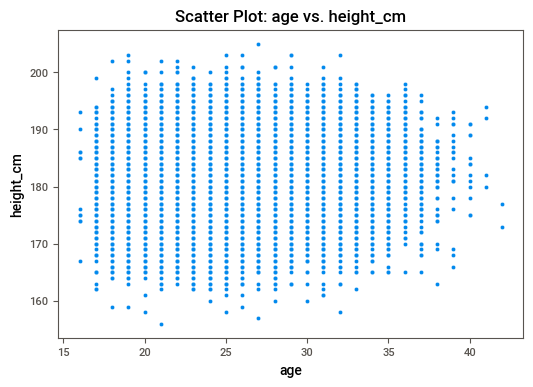

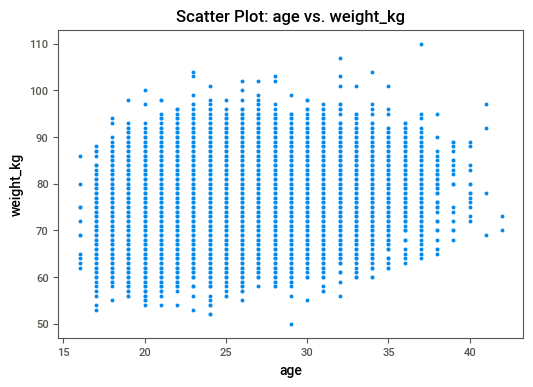

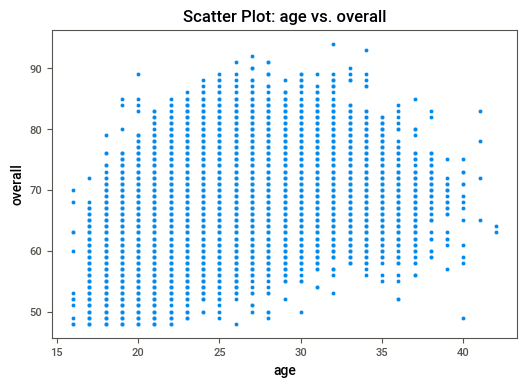

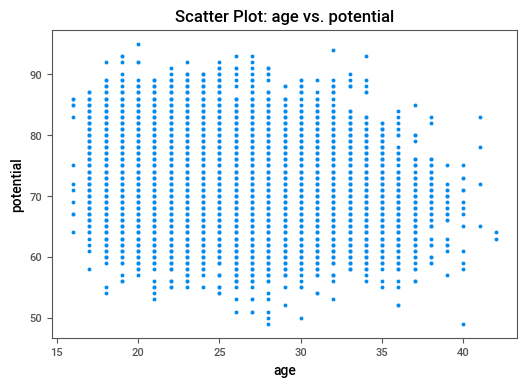

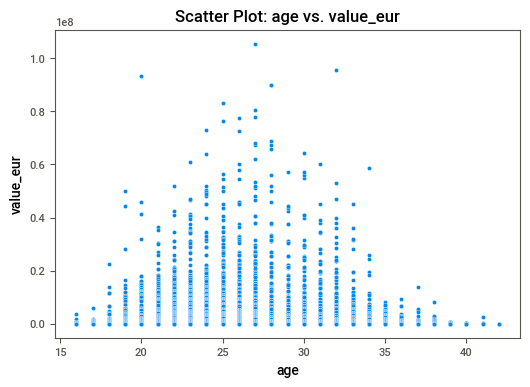

...

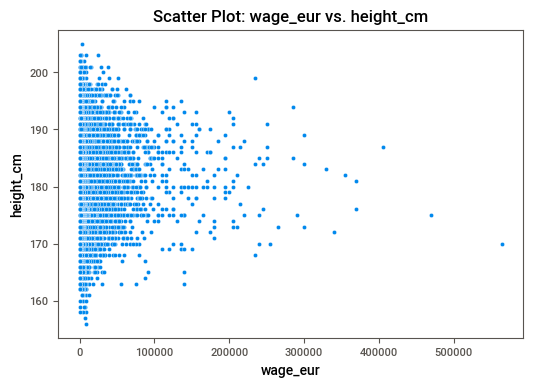

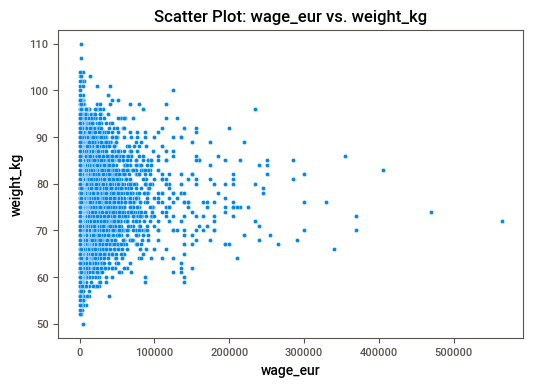

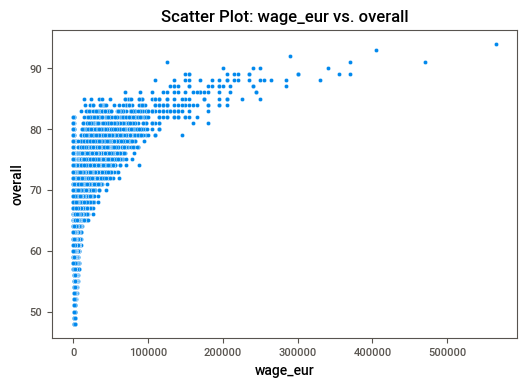

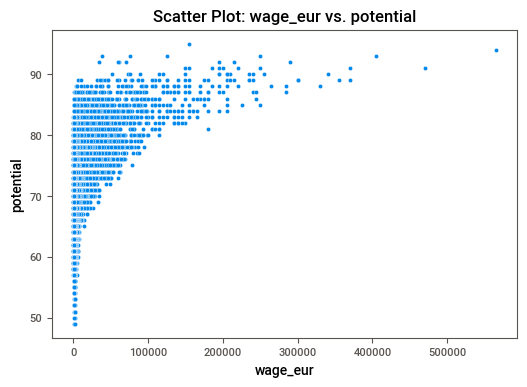

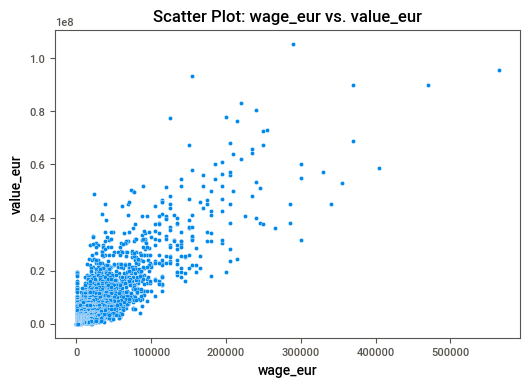

In [ ]:
# Create scatter plots for selected pairs of numerical attributes
for attribute1 in numerical_attributes:
    for attribute2 in numerical_attributes:
        if attribute1 != attribute2:
            plt.figure(figsize=(6, 4))
            sns.scatterplot(x=data[attribute1], y=data[attribute2])
            plt.title(f'Scatter Plot: {attribute1} vs. {attribute2}')
            plt.xlabel(attribute1)
            plt.ylabel(attribute2)
            plt.show()

<h4>Categorical Attributes Analysis</h4>

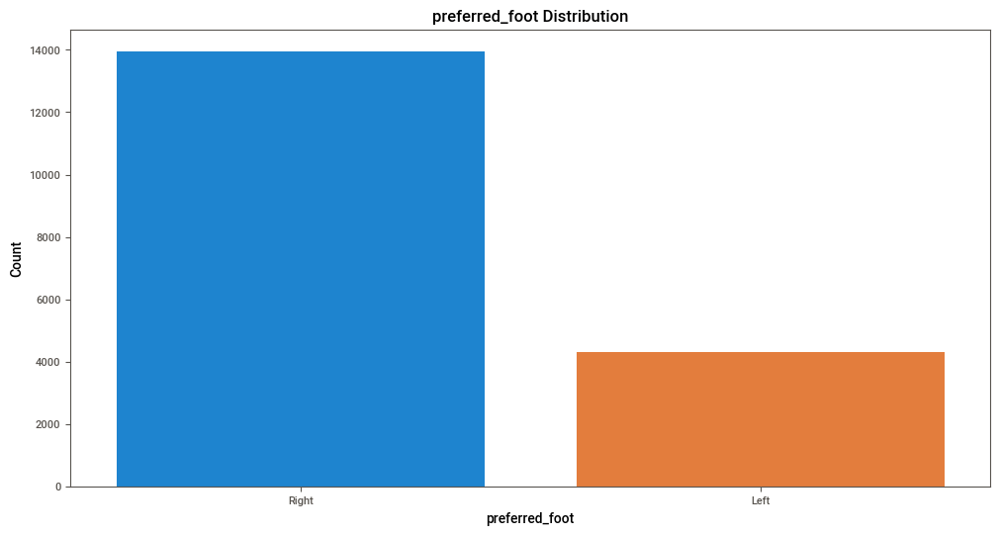

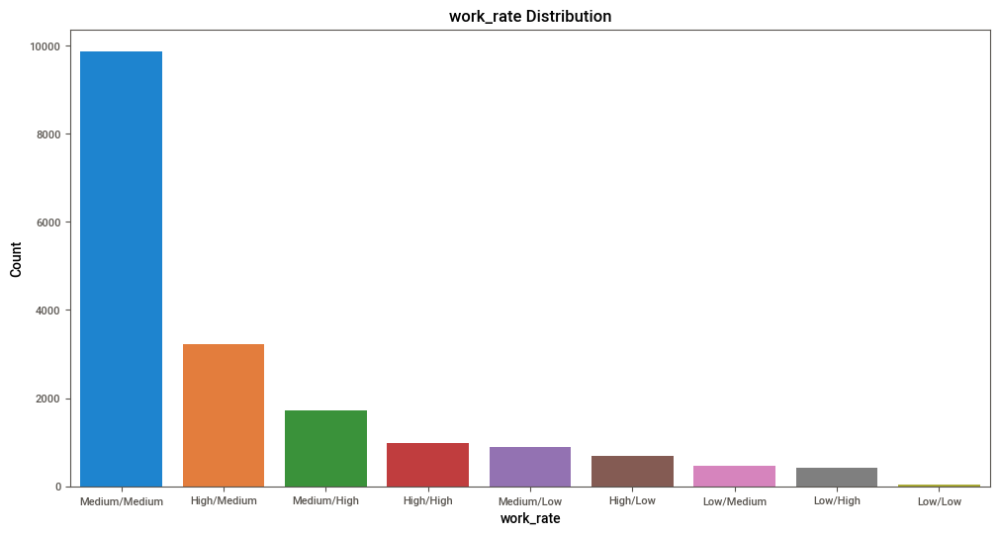

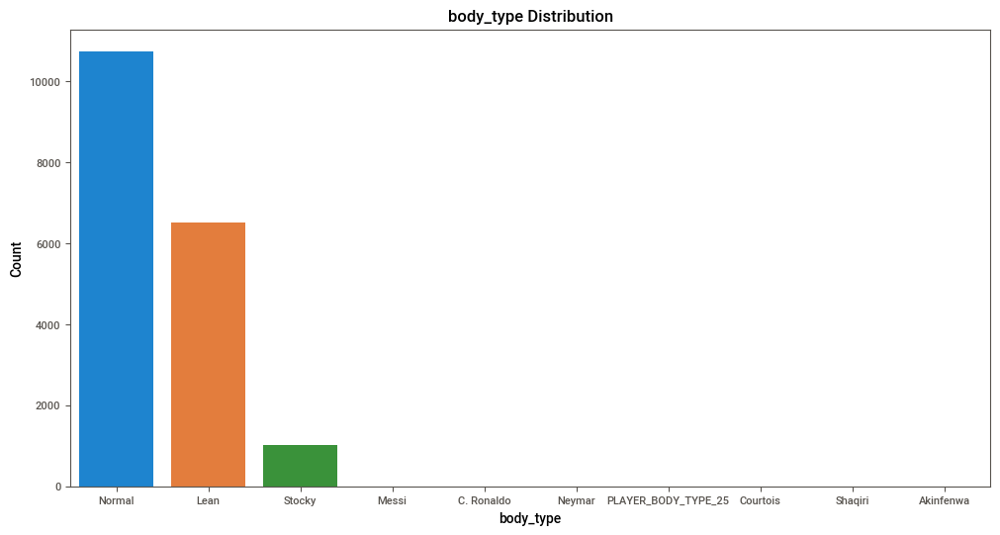

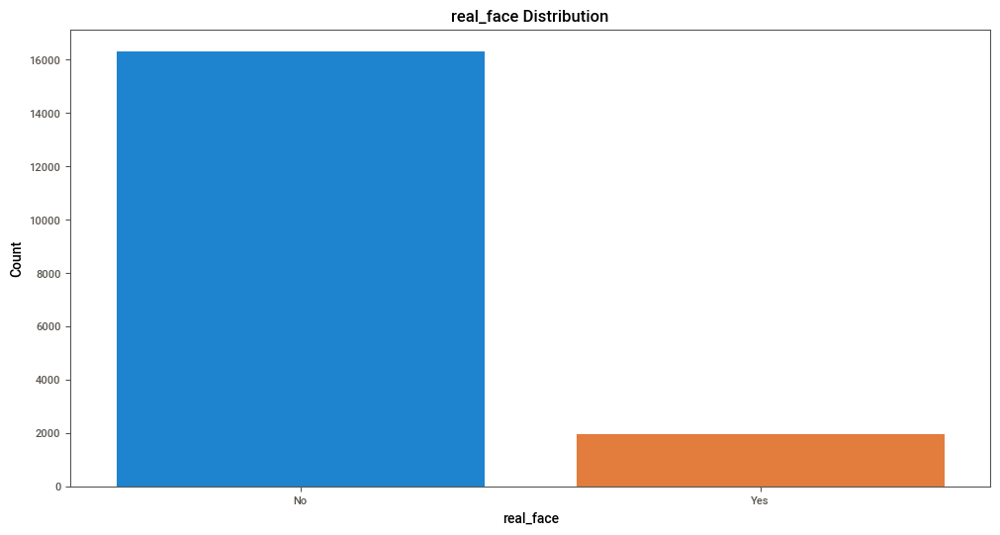

In [ ]:
# Select a subset of categorical attributes for analysis
categorical_attributes = data.loc[:,['preferred_foot', 'work_rate', 'body_type', 'real_face']]

for columns in categorical_attributes:
    # Plot for 'preferred_foot'
    plt.figure(figsize=(12, 6))
    sns.countplot(data=categorical_attributes, x=columns, order=data[columns].value_counts().index)
    plt.title(columns + ' Distribution')
    plt.xlabel(columns)
    plt.ylabel('Count')
    plt.show()

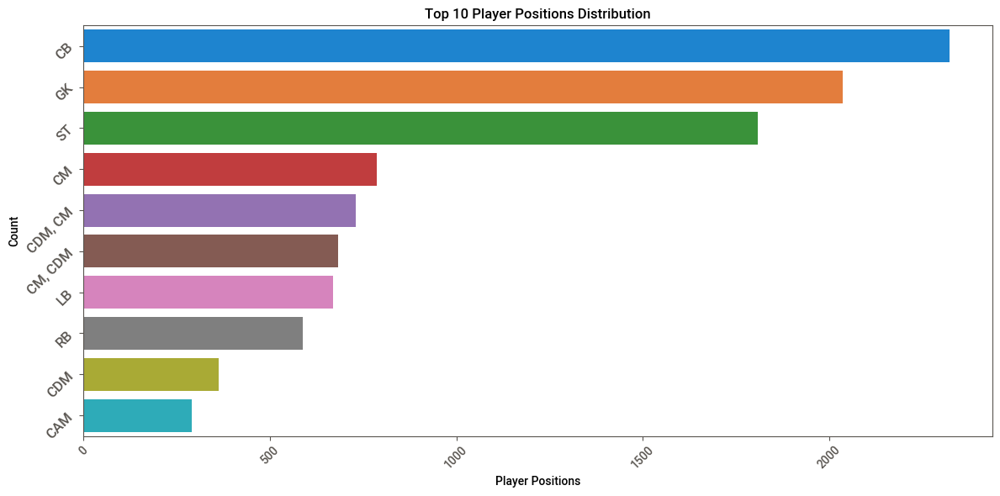

In [ ]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=data, y='player_positions', order=data['player_positions'].value_counts().head(10).index)
plt.title('Top 10 Player Positions Distribution')
plt.xlabel('Player Positions')
plt.ylabel('Count')
ax.tick_params(axis='x', rotation=45, labelsize=10)  # Rotate x-axis labels and adjust font size
ax.tick_params(axis='y', rotation=45, labelsize=12)  # Rotate x-axis labels and adjust font size
plt.tight_layout()  # Ensure labels are not cut off
plt.show()

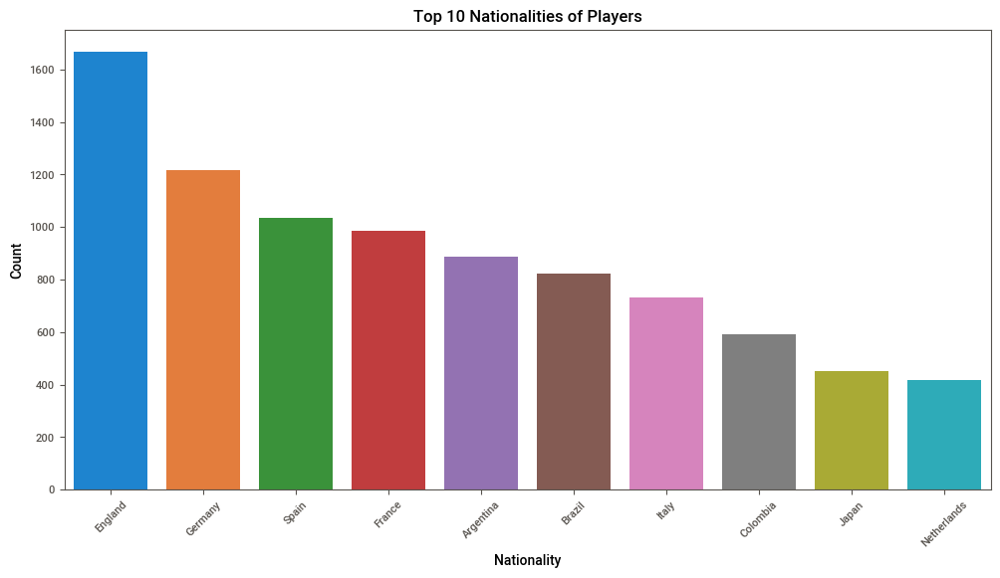

In [ ]:
# Plot for 'nationality' (Top 10 nationalities)
top_10_nationalities = data['nationality'].value_counts().head(10).index
plt.figure(figsize=(12, 6))
sns.countplot(data=data[data['nationality'].isin(top_10_nationalities)], x='nationality',
              order=top_10_nationalities)
plt.title('Top 10 Nationalities of Players')
plt.xlabel('Nationality')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

<h4>Skills & Performance  Attributes Analysis</h4>

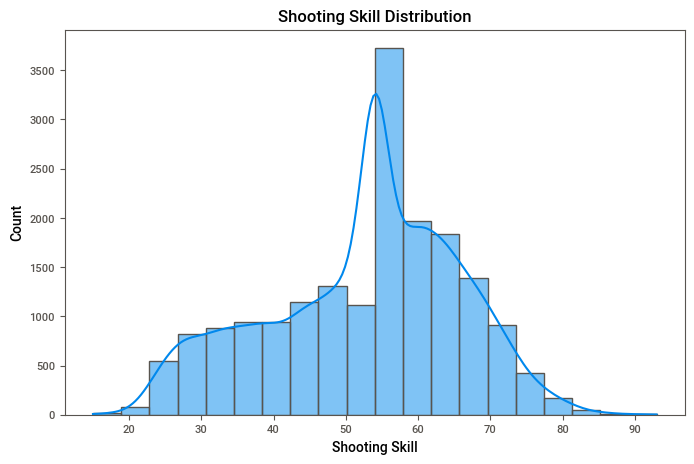

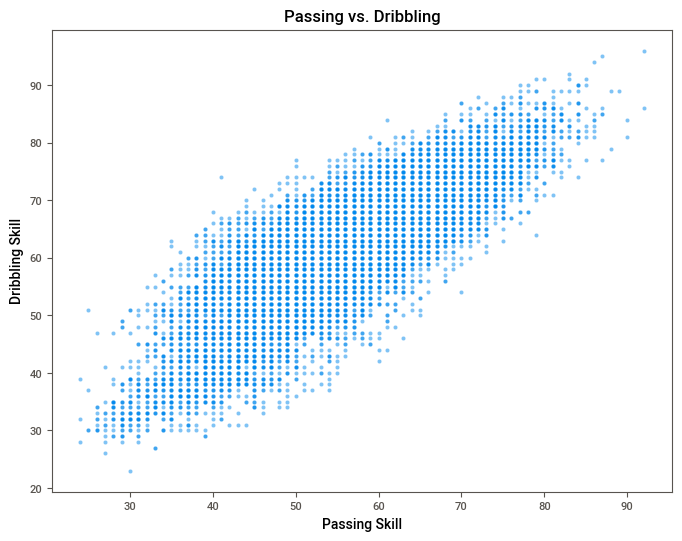

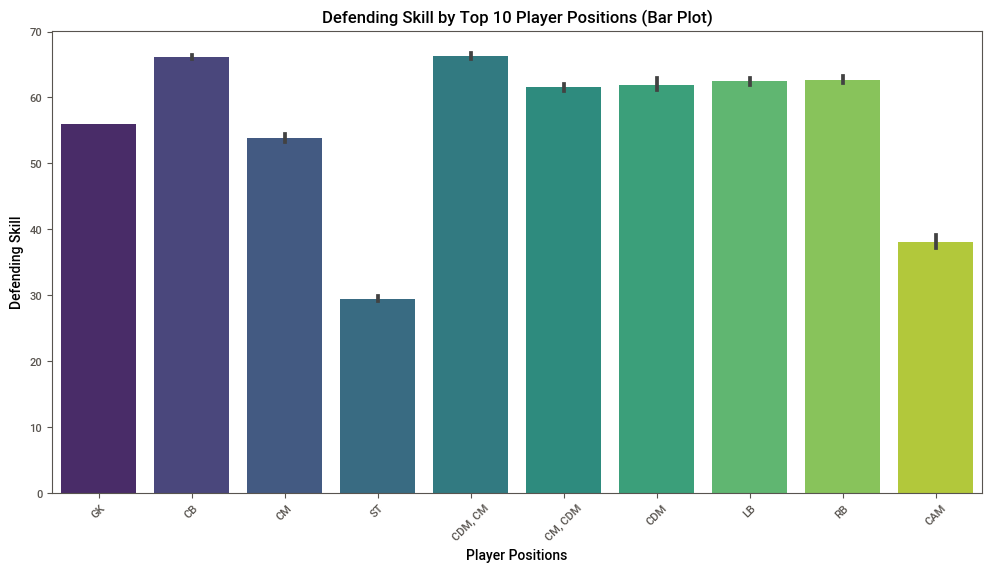

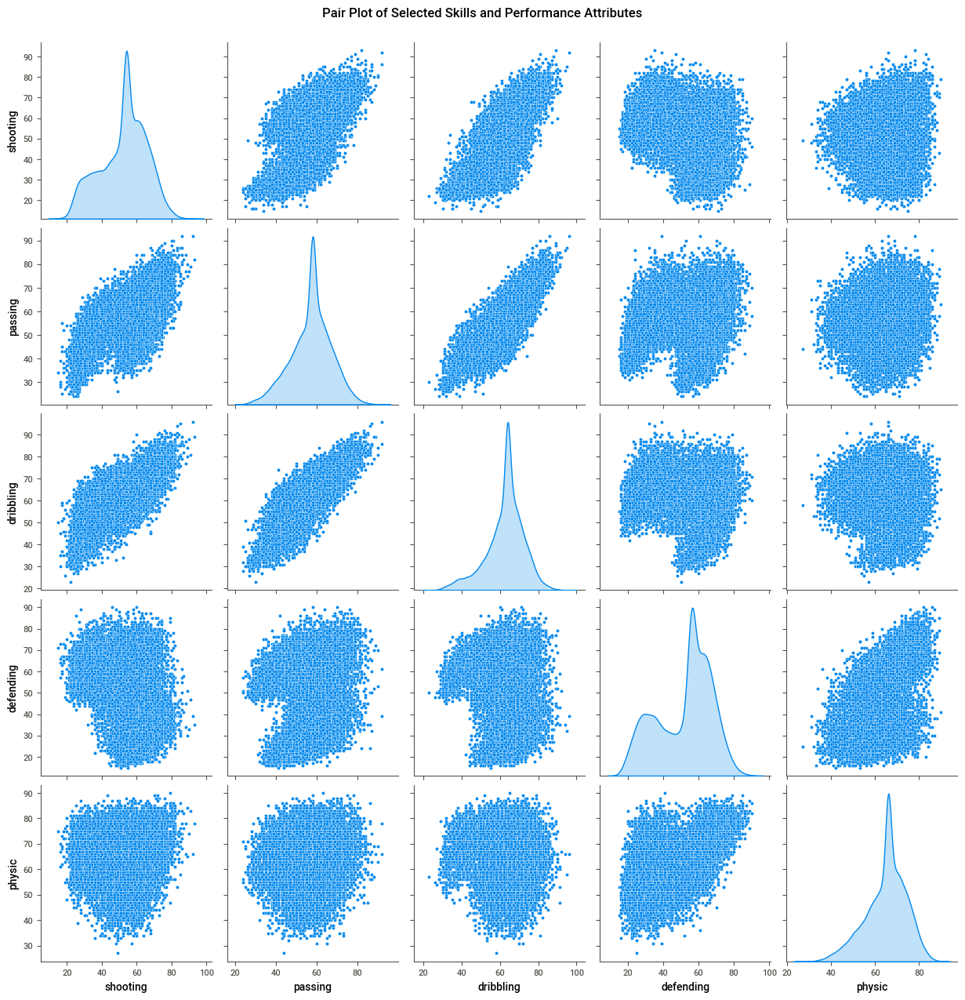

In [ ]:

# Histogram for 'shooting'
plt.figure(figsize=(8, 5))
sns.histplot(data=data, x='shooting', bins=20, kde=True)
plt.title('Shooting Skill Distribution')
plt.xlabel('Shooting Skill')
plt.ylabel('Count')
plt.show()

# Scatter plot: 'passing' vs. 'dribbling'
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='passing', y='dribbling', alpha=0.5)
plt.title('Passing vs. Dribbling')
plt.xlabel('Passing Skill')
plt.ylabel('Dribbling Skill')
plt.show()

# Find the top 10 player positions based on player count
top_10_positions = data['player_positions'].value_counts().head(10).index

# Filter the data for the top 10 player positions
filtered_data = data[data['player_positions'].isin(top_10_positions)]

# Create a bar plot for defending skill for the top 10 player positions
plt.figure(figsize=(12, 6))
sns.barplot(data=filtered_data, x='player_positions', y='defending', palette='viridis')
plt.title('Defending Skill by Top 10 Player Positions (Bar Plot)')
plt.xlabel('Player Positions')
plt.ylabel('Defending Skill')
plt.xticks(rotation=45)
plt.show()


# Pair plot for selected attributes
selected_attributes = ['shooting', 'passing', 'dribbling', 'defending', 'physic']
sns.pairplot(data=data, vars=selected_attributes, diag_kind='kde')
plt.suptitle('Pair Plot of Selected Skills and Performance Attributes', y=1.02)
plt.show()


<h1>Linear Relation Between Dribbling and Passing:</h1>
<p><strong>Linear relationship</strong> between the <strong>dribbling</strong> and <strong>passing</strong> skills of players. This implies that as the dribbling skill increases, the passing skill tends to increase as well. This relationship might be indicative of players who are proficient in both ball control and distributing passes effectively.</p>

<h1>Defending Skill Variation by Position:</h1>

<h2>CDM/CM Position:</h2>
<p>Players in the '<strong>CDM</strong>' and '<strong>CM</strong>' positions tend to have <strong>higher defending skills</strong> compared to other positions. This suggests that these positions require strong defensive capabilities.</p>

<h2>CDM Position:</h2>
<p>Specifically, the '<strong>CDM</strong>' position shows <strong>higher defending skills</strong> compared to others. This position is known for its defensive role in the team, so it's expected that players in this position excel in defending.</p>

<h2>RB and LB Positions:</h2>
<p>Players in the '<strong>RB</strong>' (right back) and '<strong>LB</strong>' (left back) positions also exhibit a <strong>constant increase</strong> in defending skills. These positions typically involve fullbacks who play a crucial role in both defending and supporting the attack.</p>

<h2>CAM Position:</h2>
<p>On the other hand, players in the '<strong>CAM</strong>' (central attacking midfielder) position show a <strong>slight increase</strong> in defending skills. While attacking midfielders are primarily focused on creating goal-scoring opportunities, it's interesting to note this minor defensive improvement in the '<strong>CAM</strong>' position.</p>


<h4>Goalkeeping Attributes Analysis</h4>

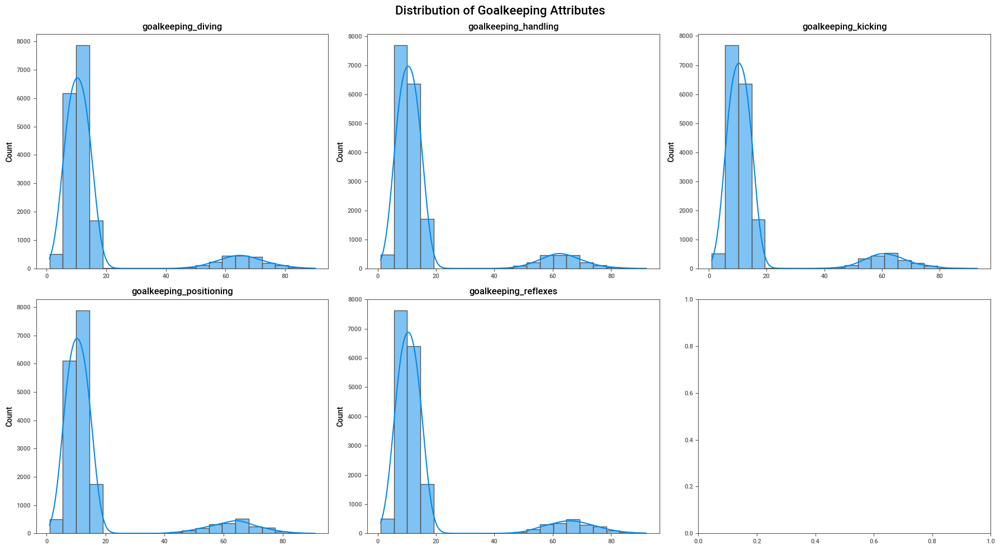

In [ ]:
# Select the goalkeeping attributes for plotting
goalkeeping_attributes = ['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
                          'goalkeeping_positioning', 'goalkeeping_reflexes']

# Create subplots for goalkeeping attributes
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Distribution of Goalkeeping Attributes', fontsize=16)

for i, attribute in enumerate(goalkeeping_attributes):
    row = i // 3
    col = i % 3
    sns.histplot(data=data, x=attribute, ax=axes[row, col], bins=20, kde=True)
    axes[row, col].set_title(attribute)
    axes[row, col].set_xlabel('')
    axes[row, col].set_ylabel('Count')

plt.tight_layout()
plt.show()


<h4>Player Traits Attributes Analysis</h4>

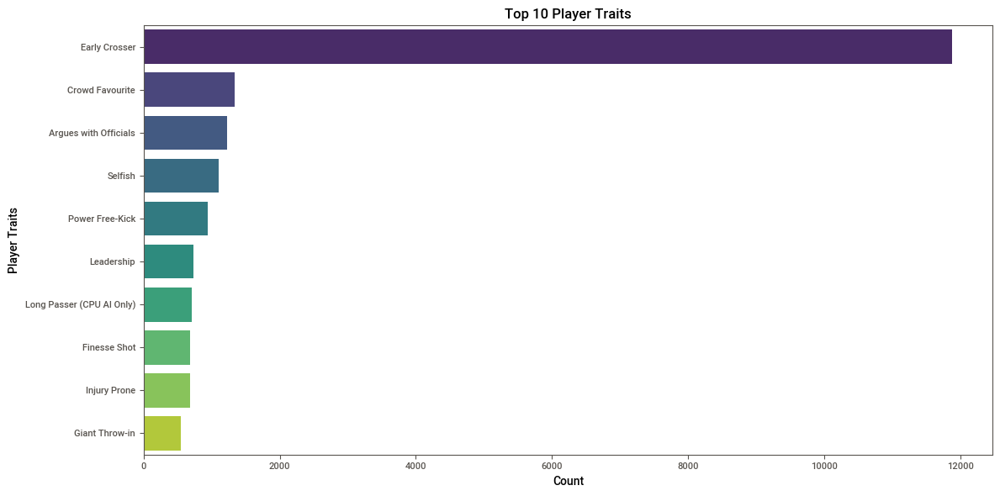

In [ ]:
# Select the column containing player traits
player_traits_column = 'player_traits'

# Split the comma-separated player traits into individual traits
all_traits = [trait.strip() for traits in data[player_traits_column].dropna() for trait in traits.split(',')]

# Count the frequency of each trait
trait_counts = pd.Series(all_traits).value_counts()

# Select the top 10 traits
top_10_traits = trait_counts.head(10)

# Create a count plot for the top 10 player traits
plt.figure(figsize=(12, 6))
sns.barplot(x=top_10_traits.values, y=top_10_traits.index, palette='viridis')
plt.title('Top 10 Player Traits')
plt.xlabel('Count')
plt.ylabel('Player Traits')
plt.tight_layout()
plt.show()

<h4>Release Clause and Value Attributes Analysis</h4>

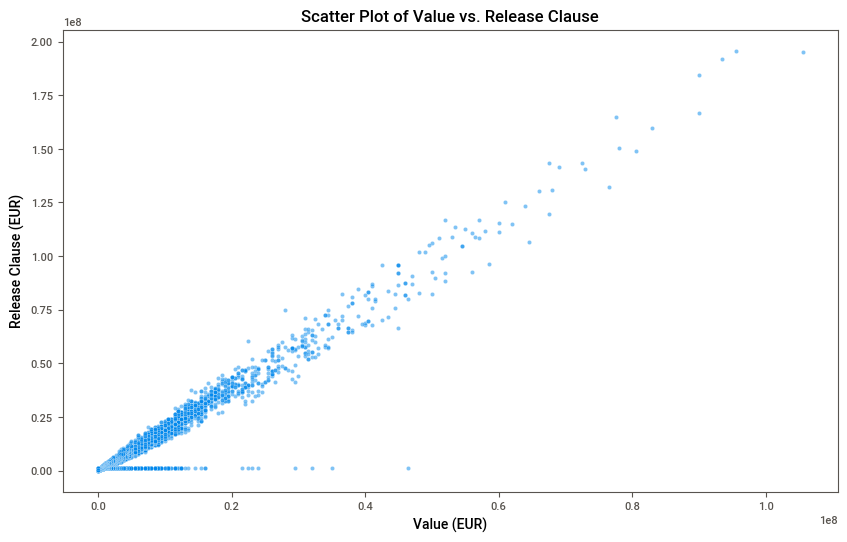

In [ ]:
# Select the 'Release Clause' and 'Value' columns
release_clause_column = 'release_clause_eur'
value_column = 'value_eur'

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x=value_column, y=release_clause_column, alpha=0.5)
plt.title('Scatter Plot of Value vs. Release Clause')
plt.xlabel('Value (EUR)')
plt.ylabel('Release Clause (EUR)')
plt.show()

<h4>Movement and Power Attributes Analysis</h4>

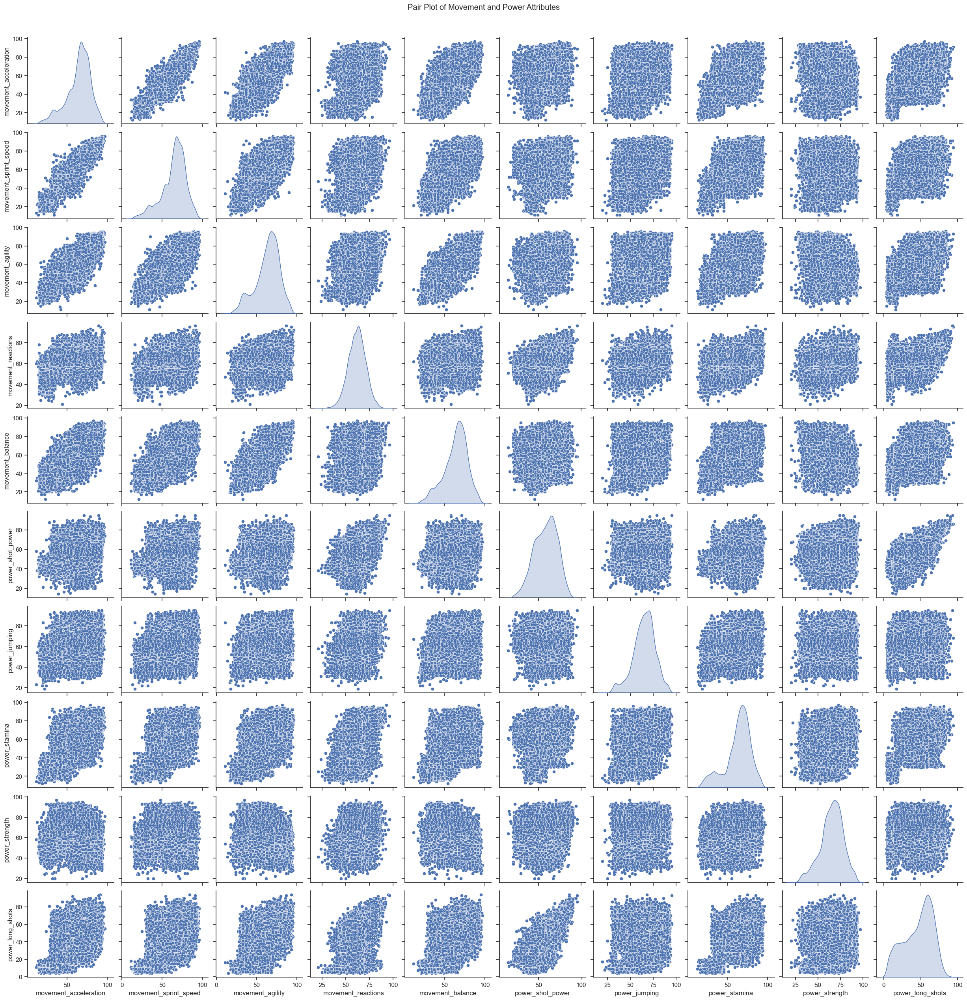

In [ ]:
# Select the movement and power attributes
movement_attributes = ['movement_acceleration', 'movement_sprint_speed', 'movement_agility',
                       'movement_reactions', 'movement_balance']
power_attributes = ['power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots']

# Combine selected attributes from both categories
selected_attributes = movement_attributes + power_attributes

# Create a pair plot for the selected attributes
sns.set(style='ticks')
sns.pairplot(data=data, vars=selected_attributes, diag_kind='kde')
plt.suptitle('Pair Plot of Movement and Power Attributes', y=1.02)
plt.show()


There is an strong relation between movement sprint speed and movement agility,movement balance and acceleration.

<h1>Strong Relation Between Movement Sprint Speed and Movement Agility:</h1>
<p><strong>Strong relationship</strong> between <strong>Movement Sprint Speed</strong> and <strong>Movement Agility</strong>. This suggests that players who have higher sprint speeds tend to also have higher agility. Sprint speed is the ability to run at top speed, while agility is the ability to change direction quickly. The correlation between these two attributes indicates that players who are faster also tend to be more agile.</p>

<h1>Strong Relation Between Movement Balance and Acceleration:</h1>
<p>Another <strong>strong relationship</strong> <strong>Movement Balance</strong> and <strong>Acceleration</strong>. This implies that players with good balance also tend to have higher acceleration. Balance is the ability to stay steady while running or controlling the ball, and acceleration is the rate at which a player can reach their maximum sprint speed. The correlation suggests that players with better balance can accelerate more effectively.</p>


<h4>Mentality and Defensive Attributes Analysis</h4>

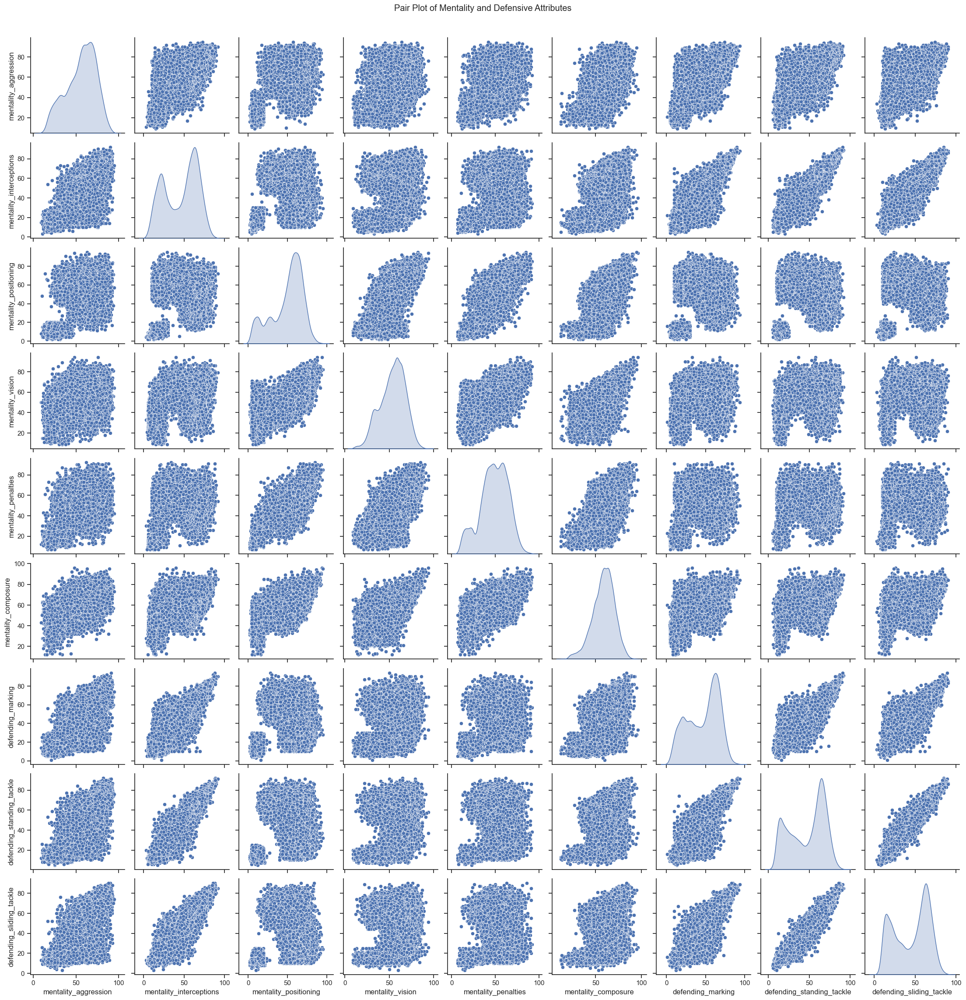

In [ ]:
# Select the mentality and defensive attributes
mentality_attributes = ['mentality_aggression', 'mentality_interceptions',
                       'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure']
defensive_attributes = ['defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle']

# Combine selected attributes from both categories
selected_attributes = mentality_attributes + defensive_attributes

# Create a pair plot for the selected attributes
sns.set(style='ticks')
sns.pairplot(data=data, vars=selected_attributes, diag_kind='kde')
plt.suptitle('Pair Plot of Mentality and Defensive Attributes', y=1.02)
plt.show()

<h1>Mentality Interception and Defending Skills:</h1>
<p><strong>Strong relationship</strong> between the <strong>mentality interception attribute</strong> and various defending skills, including defending sliding tackle, standing tackle, and defending marking. This suggests that players with higher interception mentality tend to excel in these defensive aspects of the game. Additionally, there is a correlation between defending marking and defending sliding tackle, standing tackle, and mentality interception, indicating that players who are good at marking also tend to perform well in these defensive skills.</p>

<h1>Mentality Position and Penalties:</h1>
<p>Some relation between the <strong>mentality position attribute</strong> and <strong>penalties</strong>. This implies that a player's positioning mentality may influence their ability to perform well in penalty situations. Players with better positioning mentality might be more composed during penalty kicks.</p>

<h1>Mentality Positioning and Penalties:</h1>
<p>There is a <strong>strong relationship</strong> between <strong>mentality positioning</strong> and <strong>penalties</strong>. This suggests that players with higher positioning mentality are more likely to perform well in penalty situations. Positioning mentality may play a significant role in a player's ability to make successful penalty kicks.</p>


<h4>Positional Attributes Analysis</h4>

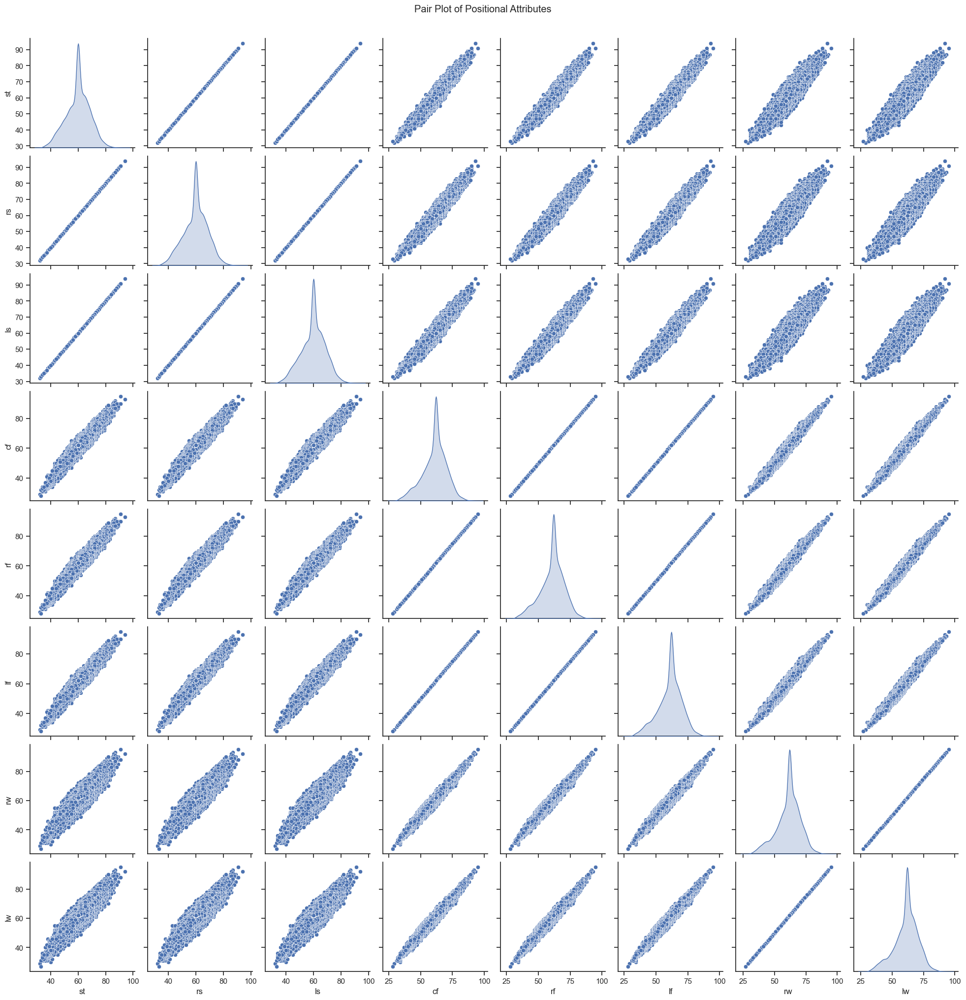

In [ ]:
# # Select the positional attributes
positional_attributes = data.loc[:,['st', 'rs', 'ls', 'cf', 'rf', 'lf', 'rw', 'lw']]


# Function to extract and convert values
def extract_and_convert(value):
    if isinstance(value, str):  # Check if the value is a string
        base_rating, potential_rating = map(int, value.split('+'))
        return (base_rating + potential_rating) / 2  # Calculate the average
    else:
        return value  # Return the value unchanged if it's not a string




for column in positional_attributes:
    data[column] = positional_attributes[column].apply(extract_and_convert)

positional_attributes = data.loc[:,['st', 'rs', 'ls', 'cf', 'rf', 'lf', 'rw', 'lw']]

# Create a pair plot for the selected positional attributes
sns.set(style='ticks')
sns.pairplot(data=data, vars=positional_attributes, diag_kind='kde')
plt.suptitle('Pair Plot of Positional Attributes', y=1.02)
plt.show()



<h4>International Reputation Attributes Analysis</h4>

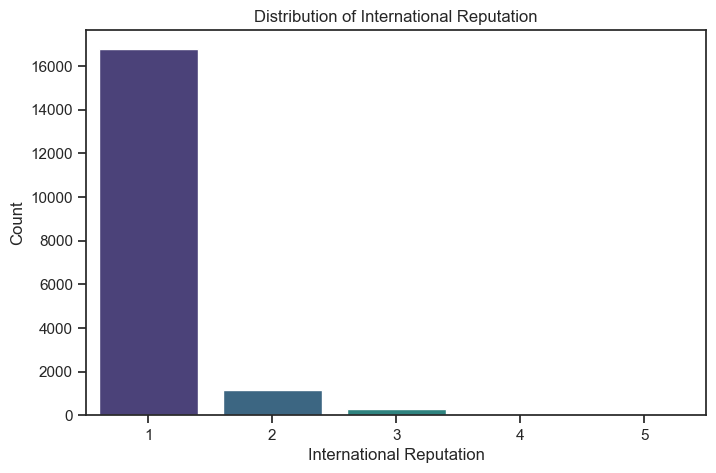

In [ ]:
# Create a count plot for International Reputation
plt.figure(figsize=(8, 5))
sns.countplot(data=data, x='international_reputation', palette='viridis')
plt.title('Distribution of International Reputation')
plt.xlabel('International Reputation')
plt.ylabel('Count')
plt.show()

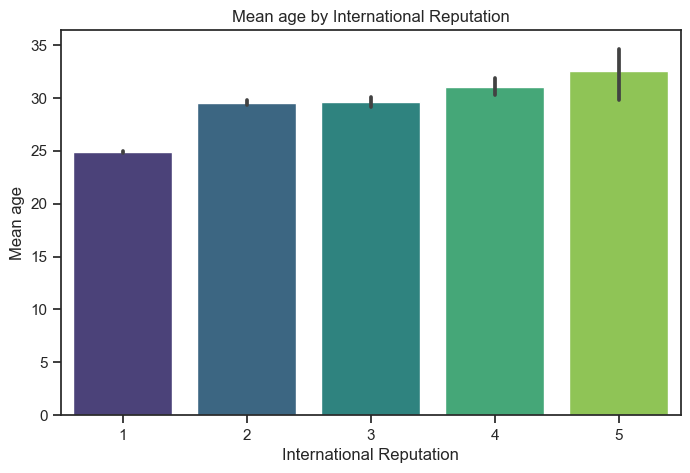

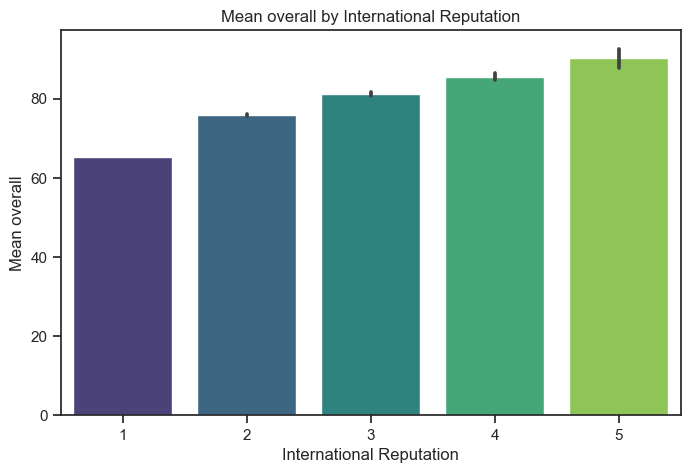

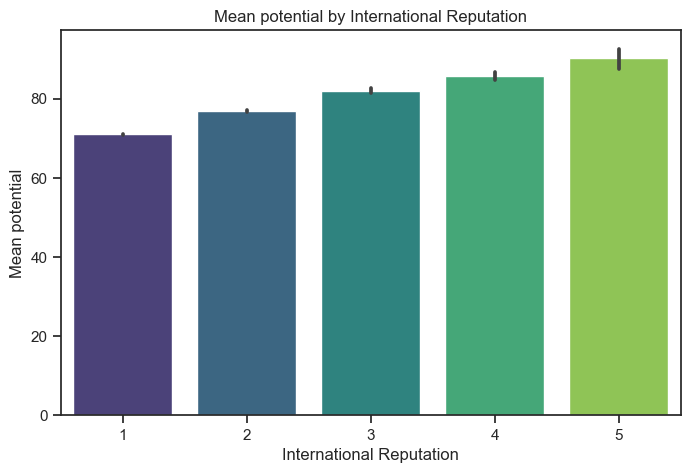

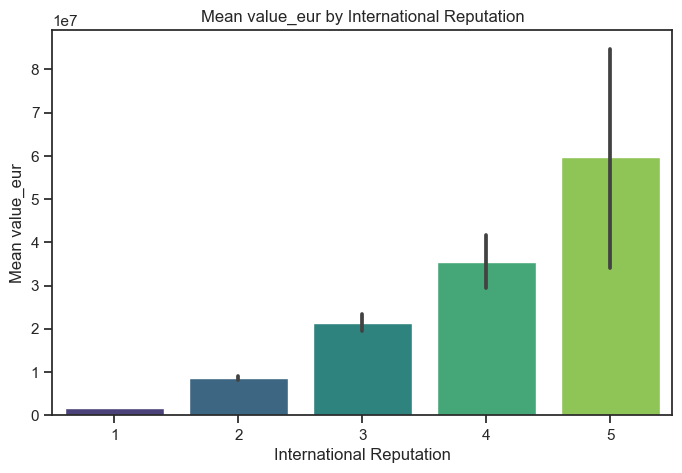

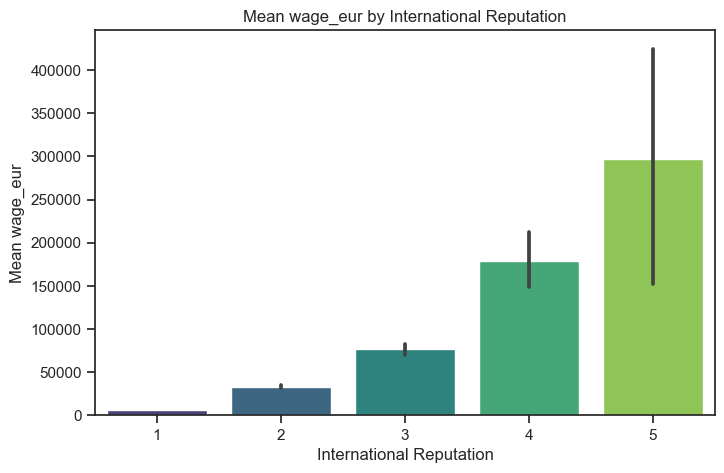

In [ ]:
# Create a bar plot  by 'International Reputation'
important_attributes = data.loc[:,['age', 'overall', 'potential', 'value_eur', 'wage_eur','international_reputation']]
important_attributes
for column in important_attributes:
    if column!='international_reputation':
        plt.figure(figsize=(8, 5))
        sns.barplot(data=important_attributes, x='international_reputation', y=column, palette='viridis')
        plt.title('Mean '+column+ ' by International Reputation')
        plt.xlabel('International Reputation')
        plt.ylabel('Mean '+column)
        plt.show()

<h1>International Reputation and Age, Overall, Potential:</h1>
<p><strong>International reputation</strong> tends to increase as a player's <strong>age</strong>, <strong>overall rating</strong>, and <strong>potential</strong> increase. This suggests that older players and those with higher overall and potential ratings are more likely to have a better international reputation. It's common for experienced and highly-rated players to gain recognition on the international stage.</p>

<h1>International Reputation and Wage Threshold:</h1>
<p>There appears to be an interesting relationship between <strong>international reputation</strong> and <strong>wage</strong> when it reaches a threshold of <strong>25k</strong>. When a player's wage crosses this threshold, their international reputation tends to increase significantly. This suggests that players earning higher wages are more likely to have a better international reputation. It could be an indicator of the market value of highly reputable players.</p>

<h1>International Reputation and Value EUR:</h1>
<p>Similar to the wage threshold, <strong>International reputation</strong> tends to increase notably when the player's <strong>value in EUR</strong> exceeds <strong>4.5</strong>. Players with higher market values are more likely to have a better international reputation, indicating a correlation between a player's market value and their international recognition.</p>


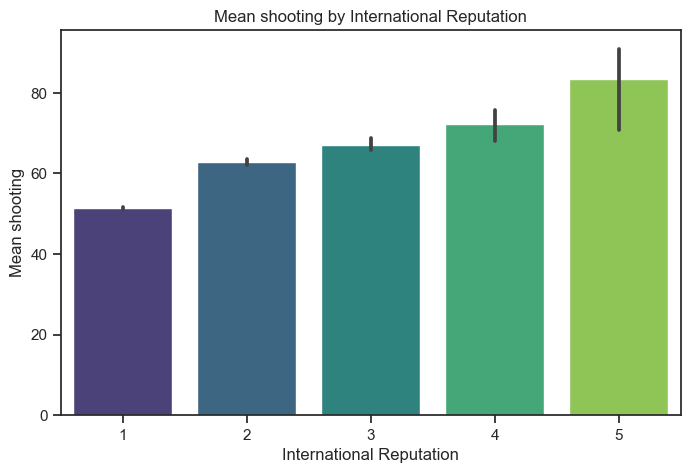

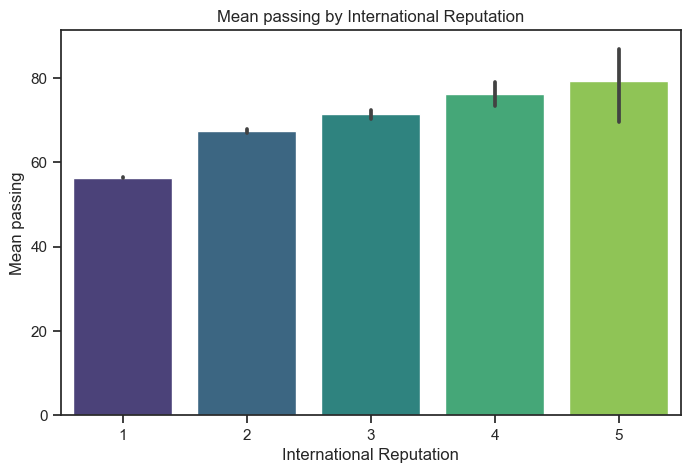

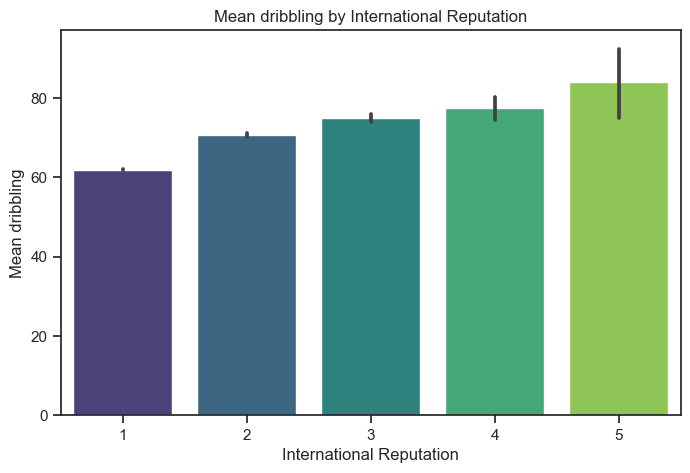

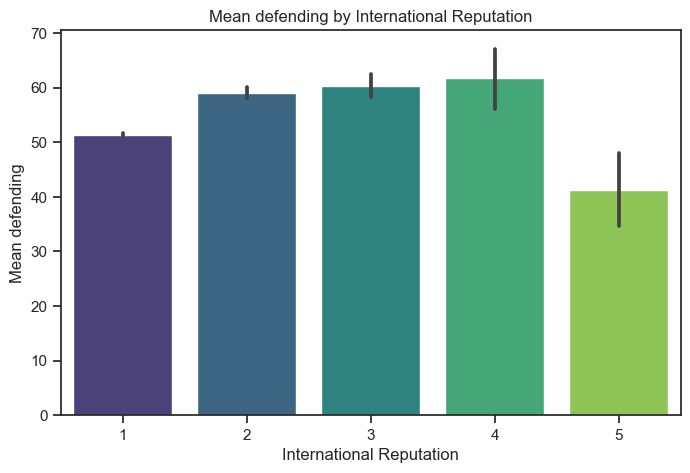

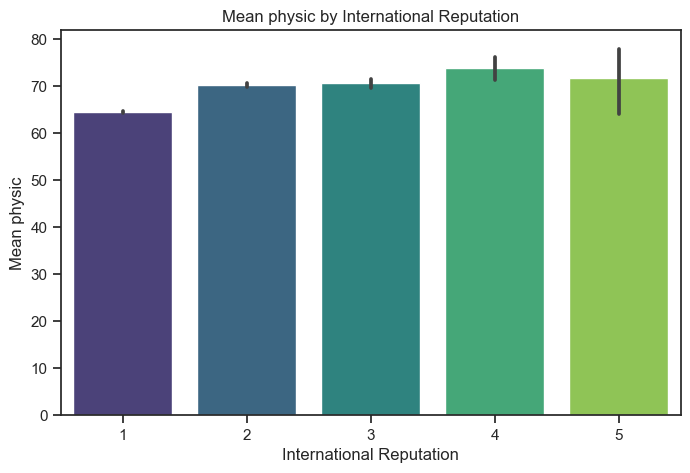

In [ ]:
# Create a bar plot  by 'International Reputation'
important_attributes = data.loc[:,['shooting', 'passing', 'dribbling', 'defending', 'physic','international_reputation']]
important_attributes
for column in important_attributes:
    if column!='international_reputation':
        plt.figure(figsize=(8, 5))
        sns.barplot(data=important_attributes, x='international_reputation', y=column, palette='viridis')
        plt.title('Mean '+column+ ' by International Reputation')
        plt.xlabel('International Reputation')
        plt.ylabel('Mean '+column)
        plt.show()

<h1>International Reputation and Attacking Skills (Shooting, Passing, Dribbling, Physic):</h1>
<p>Gradual increase in <strong>international reputation</strong> as players excel in attacking skills such as <strong>shooting</strong>, <strong>passing</strong>, <strong>dribbling</strong>, and <strong>physical attributes</strong>. This suggests that players who are proficient in these skills tend to have a better international reputation. Attacking skills play a significant role in a player's overall performance and recognition.</p>

<h1>International Reputation and Defending Skills:</h1>
<p>Interestingly, <strong>international reputation</strong> tends to increase as players improve their <strong>defending skills</strong>. This indicates that strong defensive capabilities also contribute to a better international reputation. Additionally, Also noticed that international reputation tends to increase even for players with lower defending skills, especially when the skill level is around 40. This suggests that some recognition on the international stage can be achieved even with relatively lower defensive abilities.</p>

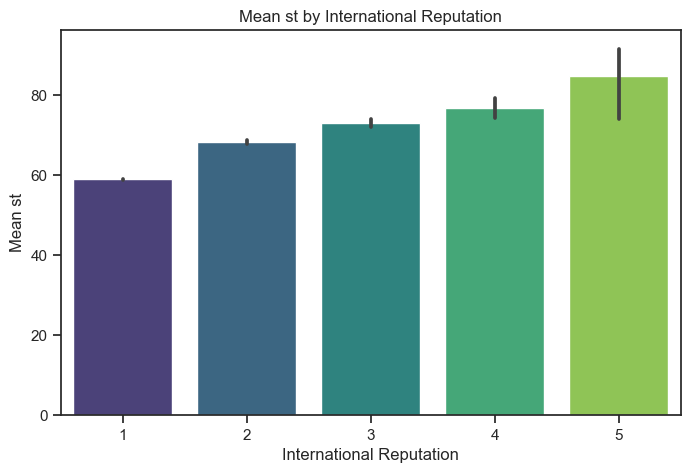

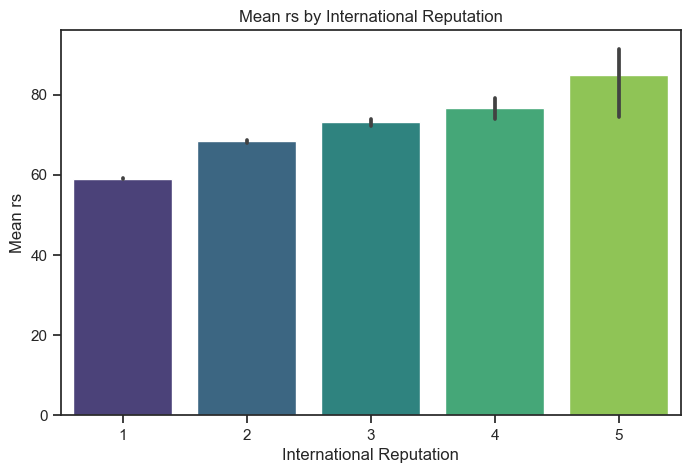

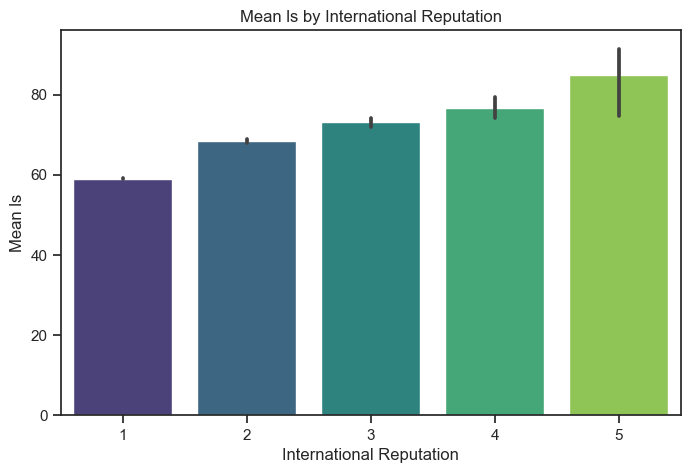

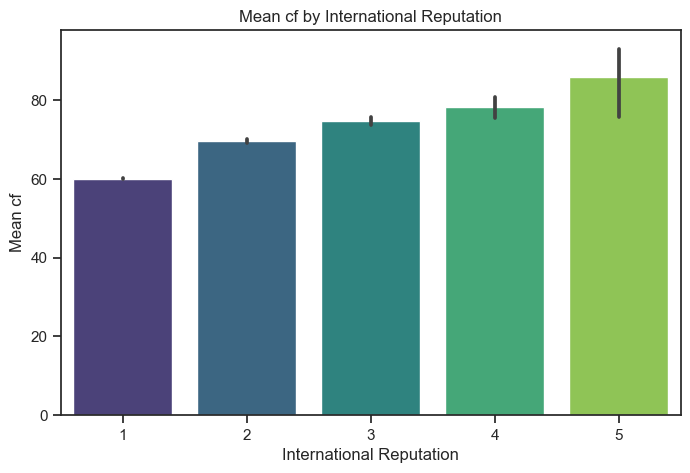

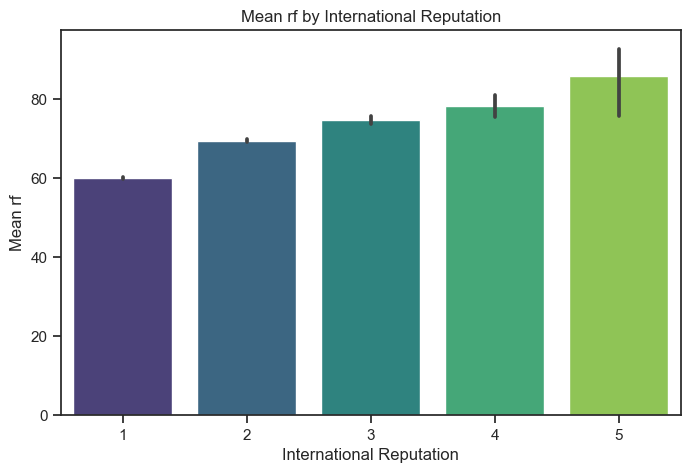

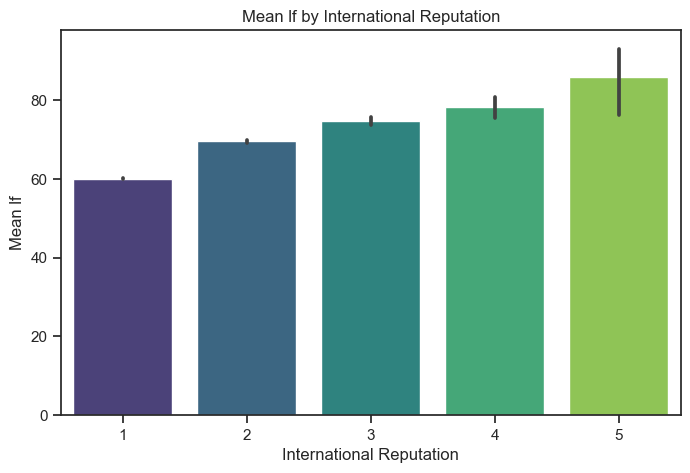

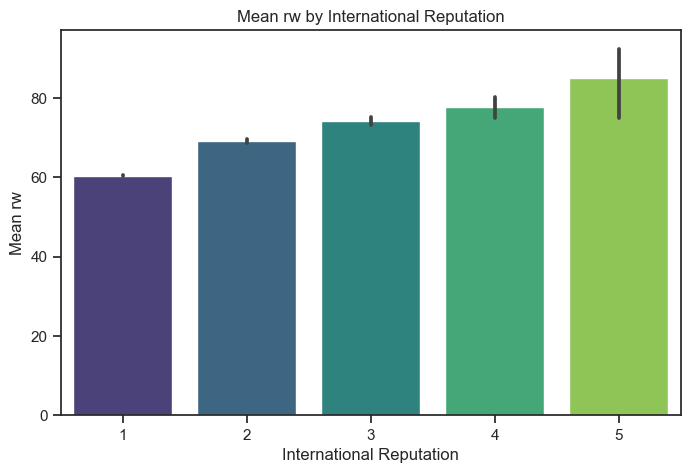

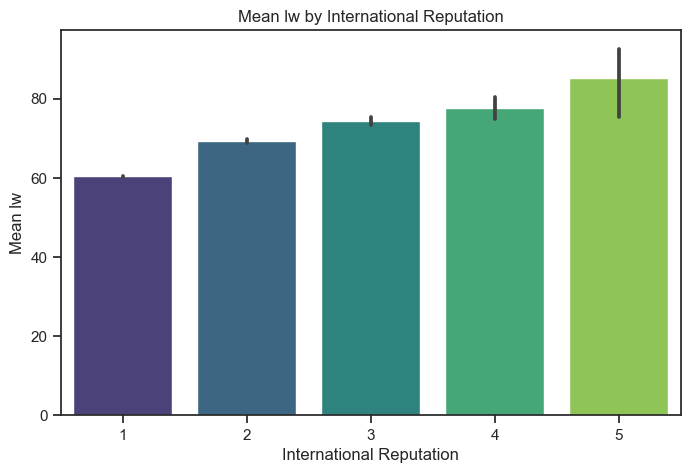

In [ ]:
# Create a bar plot  by 'International Reputation'
positional_attributes['international_reputation']=data['international_reputation']


for column in positional_attributes:
    if column!='international_reputation':
        plt.figure(figsize=(8, 5))
        sns.barplot(data=positional_attributes, x='international_reputation', y=column, palette='viridis')
        plt.title('Mean '+column+ ' by International Reputation')
        plt.xlabel('International Reputation')
        plt.ylabel('Mean '+column)
        plt.show()



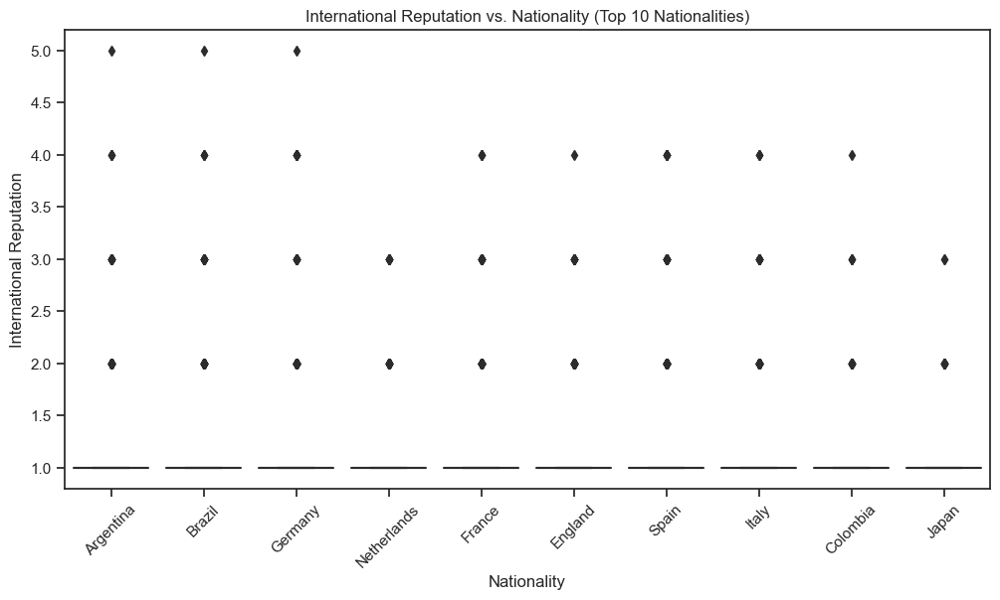

In [ ]:
# Create a count plot for International Reputation by Nationality
# Determine the top 10 nationalities
top_10_nationalities = data['nationality'].value_counts().head(10).index

# Filter the dataset to include only players from the top 10 nationalities
filtered_data = data[data['nationality'].isin(top_10_nationalities)]
# Create a plot to visualize 'International Reputation' vs. 'Nationality'
plt.figure(figsize=(12, 6))
sns.boxplot(data=filtered_data, x='nationality', y='international_reputation', palette='viridis')
plt.title('International Reputation vs. Nationality (Top 10 Nationalities)')
plt.xlabel('Nationality')
plt.ylabel('International Reputation')
plt.xticks(rotation=45)
plt.show()

<h1>Higher International Reputation Countries:</h1>
<p>The players from countries like <strong>Argentina</strong>, <strong>Brazil</strong>, and <strong>Germany</strong> tend to have <strong>higher international reputations</strong>. This suggests that these nations produce footballers who are more likely to be recognized and well-regarded on the international stage.</p>

<h1>Lower International Reputation Countries:</h1>
<p>On the other hand,the players from countries like the <strong>Netherlands</strong> and <strong>Japan</strong> have <strong>lower international reputations</strong>. This indicates that footballers from these nations may be less recognized or celebrated on the international scene.</p>

<h1>Intermediate International Reputation Countries:</h1>
<p>For countries like <strong>France</strong>, <strong>England</strong>, <strong>Spain</strong>, and <strong>Italy</strong>observed an <strong>average level of international reputation</strong> among their players. These nations have a mix of players with varying levels of international recognition.</p>


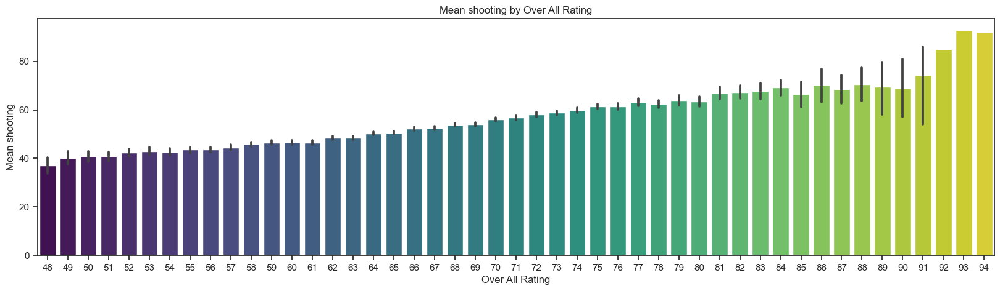

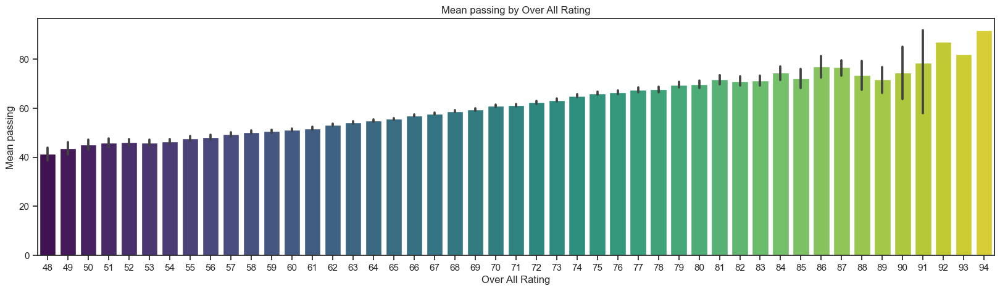

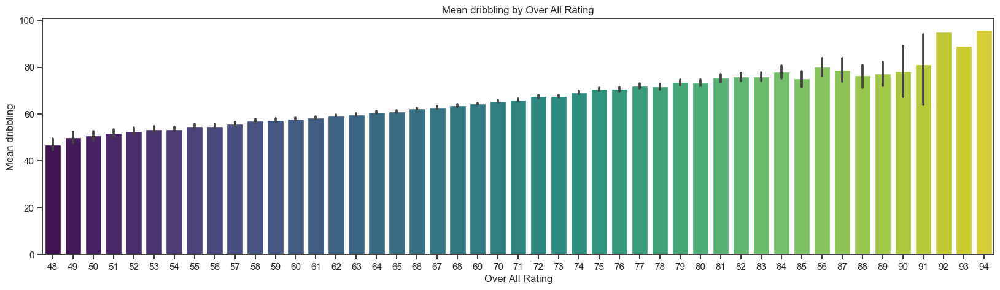

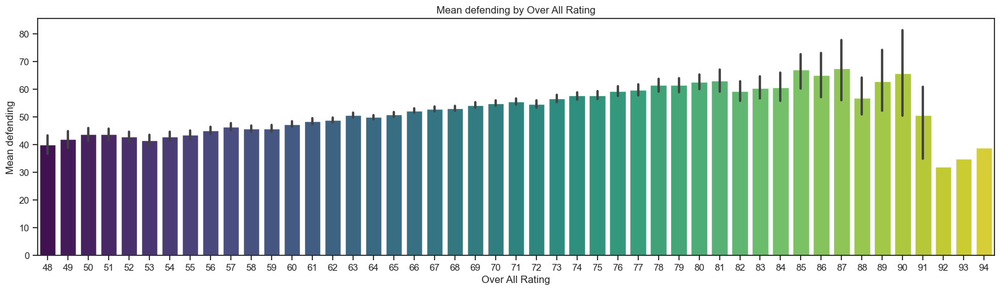

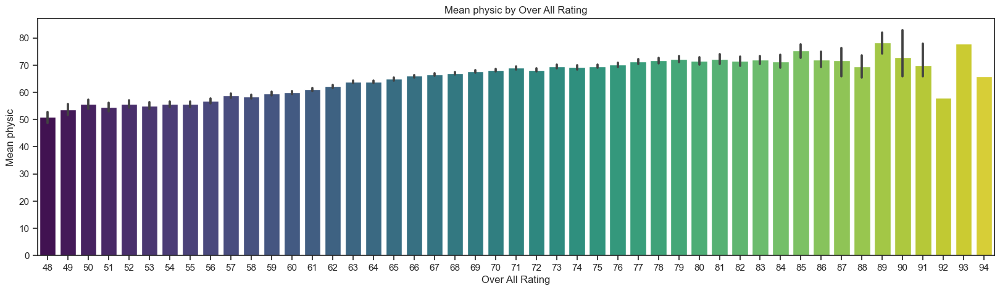

In [ ]:
# Create a bar plot  by 'Over All Rating'
important_attributes = data.loc[:,['shooting', 'passing', 'dribbling', 'defending', 'physic','overall']]
important_attributes
for column in important_attributes:
    if column!='overall':
        plt.figure(figsize=(20, 5))
        sns.barplot(data=important_attributes, x='overall', y=column, palette='viridis')
        plt.title('Mean '+column+ ' by Over All Rating')
        plt.xlabel('Over All Rating')
        plt.ylabel('Mean '+column)
        plt.show()

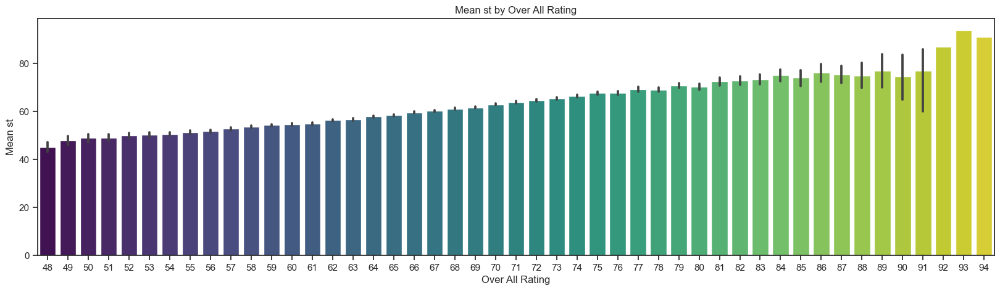

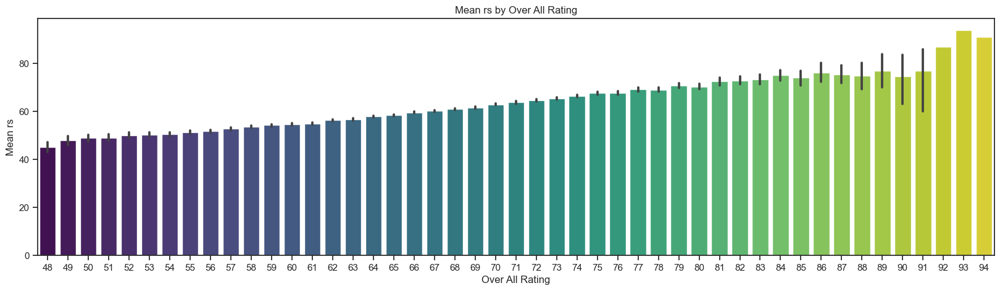

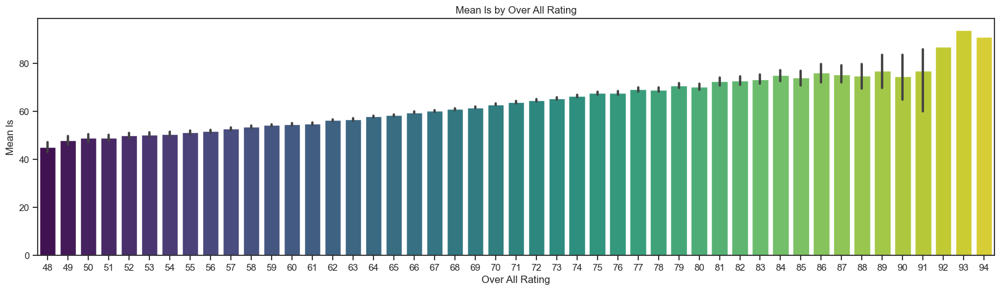

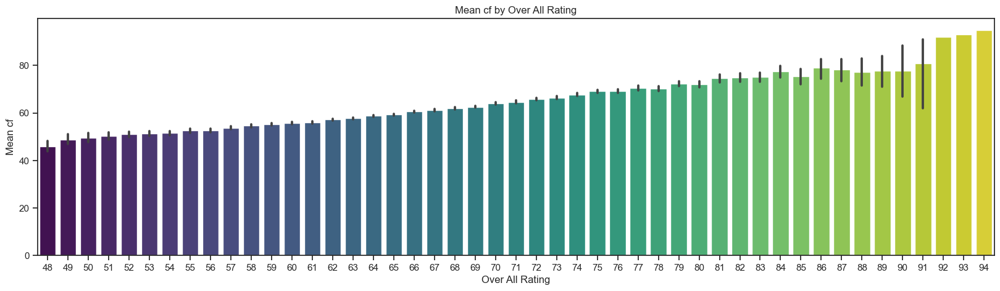

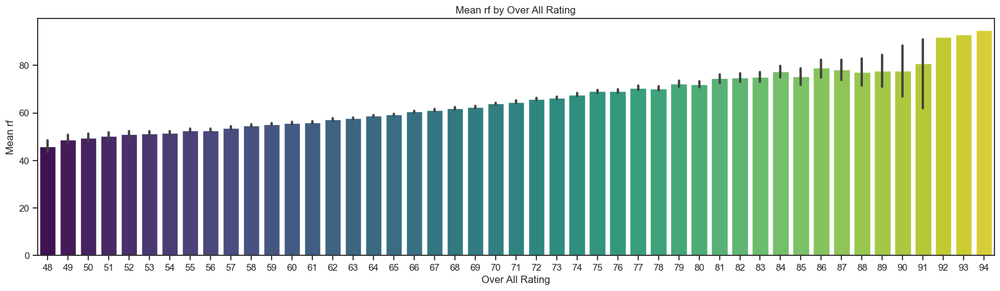

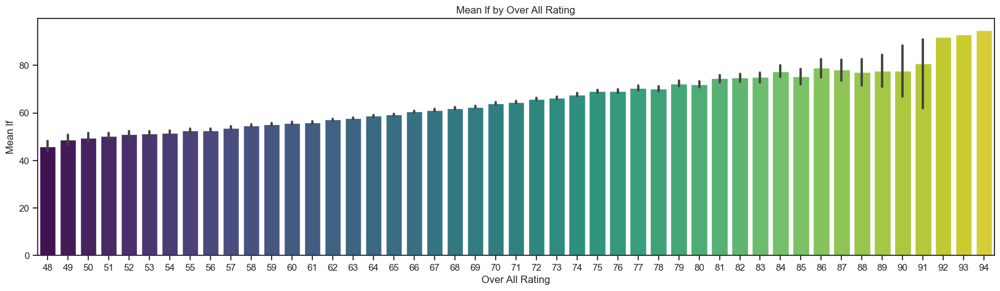

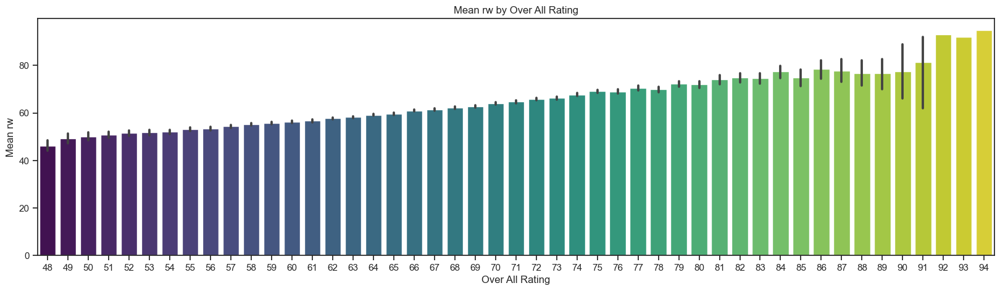

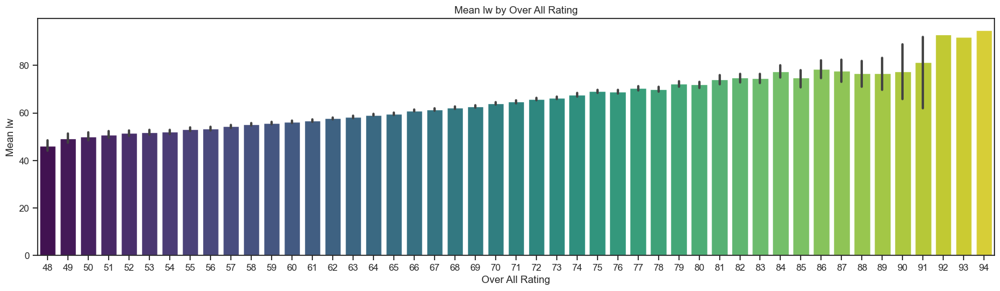

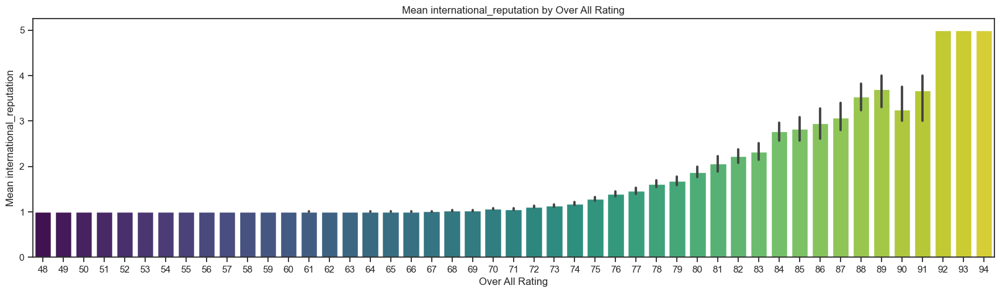

In [ ]:
# Create a bar plot  by 'Over All Rating'
positional_attributes['overall']=data['overall']


for column in positional_attributes:
    if column!='overall':
        plt.figure(figsize=(20, 5))
        sns.barplot(data=positional_attributes, x='overall', y=column, palette='viridis')
        plt.title('Mean '+column+ ' by Over All Rating')
        plt.xlabel('Over All Rating')
        plt.ylabel('Mean '+column)
        plt.show()

In [ ]:
data.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,RW,87.0,92.0,92.0,96.0,39.0,66.0,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,91.0,91.0,91.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,94.0,89.0,89.0,89.0,94.0,70.0,68.0,68.0,68.0,70.0,65.0,54.0,54.0,54.0,65.0
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,LW,90.0,93.0,82.0,89.0,35.0,78.0,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,94.0,94.0,94.0,92.0,93.0,93.0,93.0,92.0,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,CAM,91.0,85.0,87.0,95.0,32.0,58.0,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,87.0,87.0,87.0,93.0,92.0,92.0,92.0,93.0,93.0,93.0,93.0,92.0,85.0,85.0,85.0,92.0,69.0,64.0,64.0,64.0,69.0,64.0,49.0,49.0,49.0,64.0
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,GK,69.0,54.0,58.0,64.0,56.0,66.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,60.0,60.0,60.0,62.0,62.0,62.0,62.0,62.0,62.0,62.0,62.0,63.0,61.0,61.0,61.0,63.0,60.0,60.0,60.0,60.0,60.0,59.0,59.0,59.0,59.0,59.0
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,LW,91.0,83.0,86.0,94.0,35.0,66.0,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,86.0,86.0,86.0,92.0,91.0,91.0,91.0,92.0,92.0,92.0,92.0,92.0,86.0,86.0,86.0,92.0,69.0,66.0,66.0,66.0,69.0,64.0,52.0,52.0,52.0,64.0


<h1> Top 10 Players with highest wage</h1>

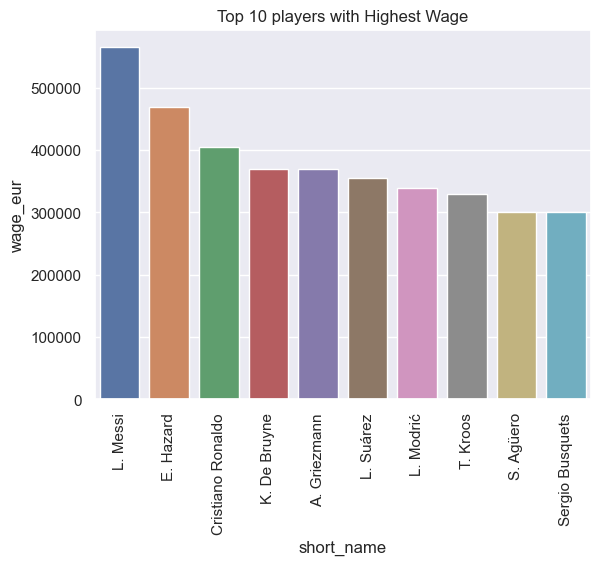

In [ ]:
# Top 10 Players with highest wage
wage=data.sort_values('wage_eur',ascending=False).head(10)
sns.set_style('darkgrid')
sns.barplot(x=wage['short_name'],y=wage['wage_eur'])
plt.title('Top 10 players with Highest Wage')
plt.xticks(rotation=90)
plt.show()

<h1> Top 10 Players with good International Reputation</h1>

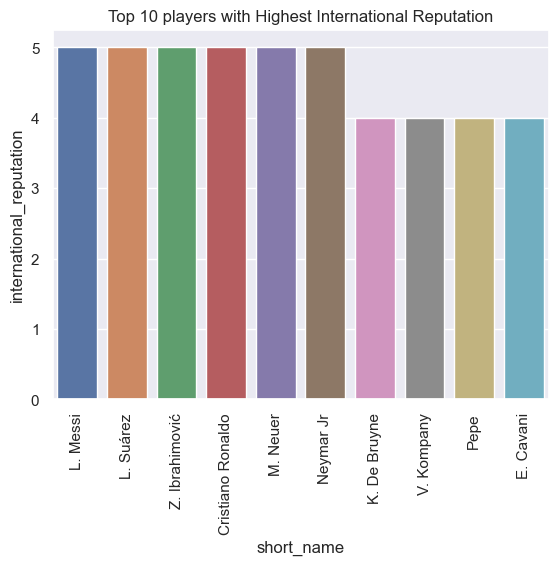

In [ ]:
# Top 10 Players with highest wage
df=data.sort_values('international_reputation',ascending=False).head(10)
sns.set_style('darkgrid')
sns.barplot(x=df['short_name'],y=df['international_reputation'])
plt.title('Top 10 players with Highest International Reputation')
plt.xticks(rotation=90)
plt.show()

<h1> Top 10 Players with highest Overall Rating</h1>

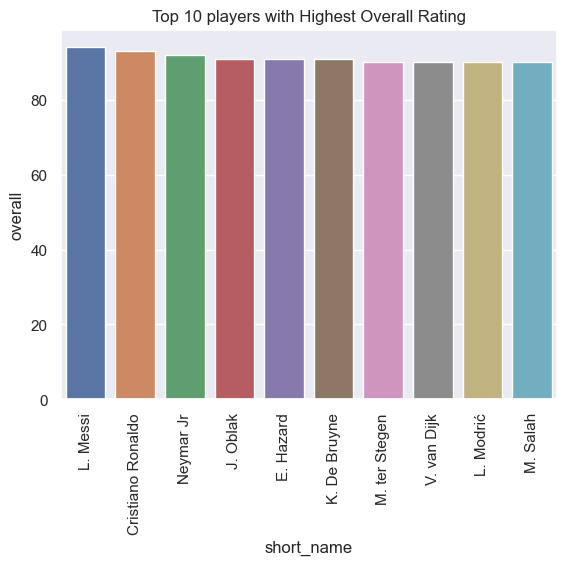

In [ ]:
# Top 10 Players with highest wage
df=data.sort_values('overall',ascending=False).head(10)
sns.set_style('darkgrid')
sns.barplot(x=df['short_name'],y=df['overall'])
plt.title('Top 10 players with Highest Overall Rating')
plt.xticks(rotation=90)
plt.show()

### **Historical comparison between Messi and Ronaldo (what skill attributes changed the most during time - compared to real-life stats);**

In [ ]:
players= data[data['short_name'].str.contains('L. Messi') | data['short_name'].str.contains('Cristiano Ronaldo')]
comparison_df = players.transpose()
comparison_df.rename(columns={0:'L_Messi',1:'Cristiano_Ronaldo'},inplace=True)
pd.set_option('display.max_rows', None)
comparison_df

,L_Messi,Cristiano_Ronaldo
short_name,L. Messi,Cristiano Ronaldo
age,32,34
height_cm,170,187
weight_kg,72,83
nationality,Argentina,Portugal
club,FC Barcelona,Juventus
overall,94,93
potential,94,93
value_eur,95500000,58500000
wage_eur,565000,405000


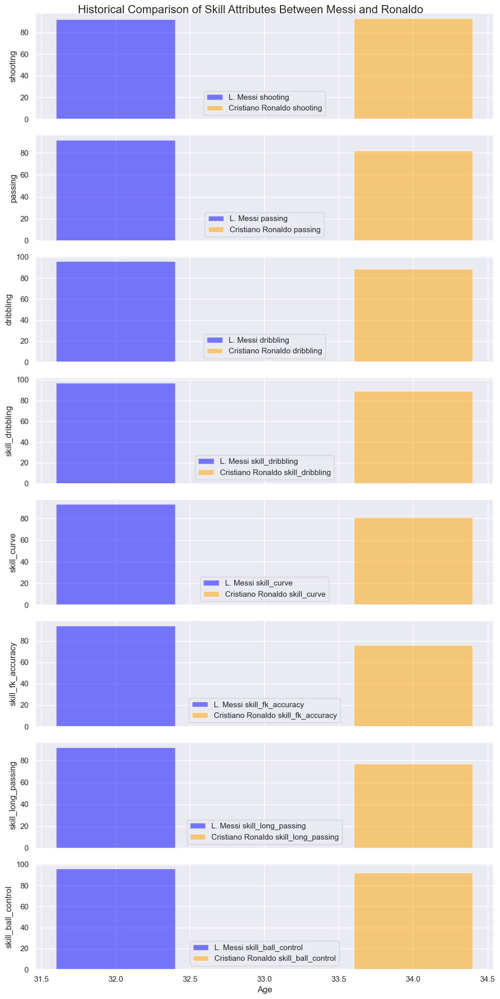

In [ ]:
# Select the skill attributes you want to analyze
# Assuming you have two separate dataframes for Messi and Ronaldo
messi_df = data[data['short_name'] == 'L. Messi']
ronaldo_df = data[data['short_name'] == 'Cristiano Ronaldo']
attributes = ['shooting', 'passing', 'dribbling','skill_dribbling','skill_curve','skill_fk_accuracy','skill_long_passing','skill_ball_control']

# Create a figure with subplots for each attribute
fig, axs = plt.subplots(len(attributes), 1, figsize=(10, 20), sharex=True)

# Plot historical comparison for each attribute
for i, attribute in enumerate(attributes):
    axs[i].bar(messi_df['age'], messi_df[attribute], label='L. Messi ' + attribute, alpha=0.5, color='blue')
    axs[i].bar(ronaldo_df['age'], ronaldo_df[attribute], label='Cristiano Ronaldo ' + attribute, alpha=0.5, color='orange')
    axs[i].set_ylabel(attribute)
    axs[i].legend()

# Set common X-axis label
axs[-1].set_xlabel('Age')

# Add a title
plt.suptitle('Historical Comparison of Skill Attributes Between Messi and Ronaldo', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()

{'pace': 3.0, 'shooting': 1.0, 'passing': 10.0, 'dribbling': 7.0, 'defending': 4.0, 'physic': 12.0}


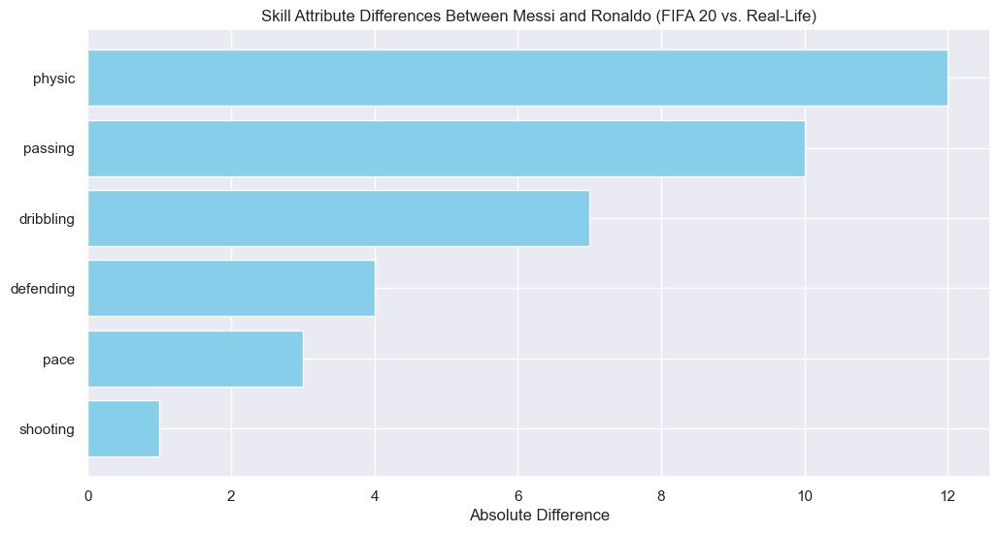

In [ ]:
# Define the skill attributes to compare
attributes = ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']
messi_df = data[data['short_name'] == 'L. Messi']
ronaldo_df = data[data['short_name'] == 'Cristiano Ronaldo']
# Create a dictionary to store the attribute differences
attribute_differences = {}

# Calculate the differences for each attribute
attribute_differences['pace'] = abs(float(messi_df['pace']) - float(ronaldo_df['pace']))

# Calculate the differences for each attribute
for attribute in attributes:
    attribute_differences[attribute] = abs(float(messi_df[attribute]) - float(ronaldo_df[attribute]))

print(attribute_differences)
# Sort the attributes by the magnitude of differences
sorted_attributes = sorted(attribute_differences.items(), key=lambda x: x[1], reverse=True)

# Extract the attribute names and differences
attribute_names = [item[0] for item in sorted_attributes]
differences = [item[1] for item in sorted_attributes]

# Create a bar chart to visualize the attribute differences
plt.figure(figsize=(12, 6))
plt.barh(attribute_names, differences, color='skyblue')
plt.xlabel('Absolute Difference')
plt.title('Skill Attribute Differences Between Messi and Ronaldo (FIFA 20 vs. Real-Life)')
plt.gca().invert_yaxis()  # Reverse the order for better visualization
plt.show()


<h1>Skill Comparison: L. Messi vs. Cristiano Ronaldo</h1>
<p>Based on the skill attributes provided in the dataset, it appears that <strong>L. Messi</strong> has <strong>higher skill values</strong> than <strong>Cristiano Ronaldo</strong> in the following attributes:</p>
<ul>
    <li><strong>Pace</strong></li>
    <li><strong>Shooting</strong></li>
    <li><strong>Passing</strong></li>
    <li><strong>Dribbling</strong></li>
    <li><strong>Defending</strong></li>
    <li><strong>Physic</strong></li>
</ul>

## Ideal budget to create a competitive team (at the level of top n teams in Europe) and at which point the budget does not allow to buy significantly better players for the 11-men lineup. An extra is the same comparison with the Potential attribute for the lineup instead of the Overall attribute;

In [ ]:

data_new=pd.read_csv('players_20.csv')
data_new.loc[data_new['wage_eur']==0,'wage_eur']=data_new['wage_eur'].median()

# Filter players from top European clubs (customize the criteria)
top_clubs = ['FC Barcelona', 'Real Madrid', 'Liverpool', 'Manchester City', 'Paris Saint-Germain', 'Real Valladolid CF']
filtered_data = data_new[data_new['club'].isin(top_clubs)]




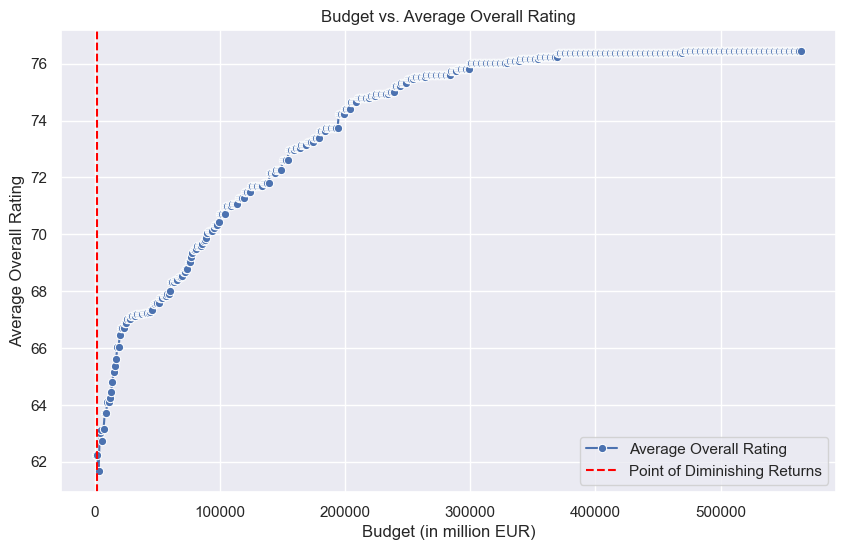

Point of Diminishing Returns for Overall Rating: 2000 million EUR


In [ ]:
# Define budget increments (e.g., every 10 million EUR)
#565000
budget_increments = range(1000, 565000, 1000)

# Initialize lists to store budget and average ratings
budgets = []
average_ratings_overall = []
average_ratings_potential = []


for budget in budget_increments:
    # Filter players whose value is within the budget
    budget_players = filtered_data[filtered_data['wage_eur'] <= budget]


    # Calculate the average "Overall" and "Potential" ratings for the lineup
    avg_rating_overall = budget_players['overall'].mean()
    avg_rating_potential = budget_players['potential'].mean()

    # Append data to lists
    budgets.append(budget)
    average_ratings_overall.append(avg_rating_overall)
    average_ratings_potential.append(avg_rating_potential)


# Create a budget vs. average rating plot for "Overall"
plt.figure(figsize=(10, 6))
sns.lineplot(x=budgets, y=average_ratings_overall, label='Average Overall Rating', marker='o')
plt.xlabel('Budget (in million EUR)')
plt.ylabel('Average Overall Rating')
plt.title('Budget vs. Average Overall Rating')
plt.grid(True)


# Identify and mark the point of diminishing returns
for i in range(len(budgets)):
    if i > 0 and average_ratings_overall[i] - average_ratings_overall[i-1] < 1.0:
        plt.axvline(x=budgets[i], color='red', linestyle='--', label='Point of Diminishing Returns')
        break

plt.legend()
plt.show()

# Print the identified point of diminishing returns
print(f"Point of Diminishing Returns for Overall Rating: {budgets[i]} million EUR")


<h1>Point of Diminishing Returns:</h1>
<p>The <strong>"Point of Diminishing Returns"</strong> for a specific attribute (in this case, <strong>"Overall Rating"</strong>) and a given budget (<strong>2000 million EUR</strong>) means that beyond this budget, spending more money to acquire players does not significantly improve the average <strong>"Overall"</strong> rating of your team. In other words, while increasing your budget initially leads to better player acquisitions and higher overall ratings, there comes a point where additional spending does not yield substantial gains in potential ratings.</p>


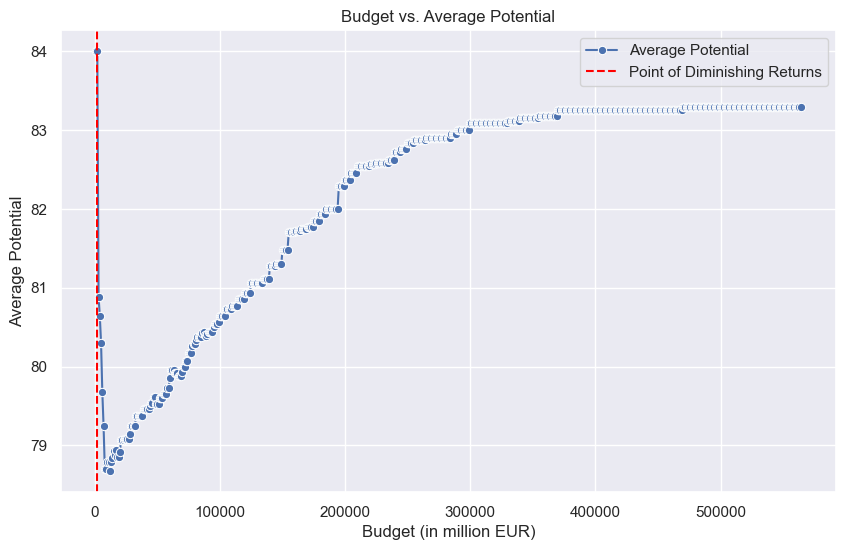

Point of Diminishing Returns for Potential: 2000 million EUR


In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=budgets, y=average_ratings_potential, label='Average Potential', marker='o')
plt.xlabel('Budget (in million EUR)')
plt.ylabel('Average Potential')
plt.title('Budget vs. Average Potential')
plt.grid(True)


# Identify and mark the point of diminishing returns
for i in range(len(budgets)):
    if i > 0 and average_ratings_potential[i] - average_ratings_potential[i-1] < 1.0:
        plt.axvline(x=budgets[i], color='red', linestyle='--', label='Point of Diminishing Returns')
        break

plt.legend()
plt.show()

# Print the identified point of diminishing returns
print(f"Point of Diminishing Returns for Potential: {budgets[i]} million EUR")


<h1>Point of Diminishing Returns:</h1>
<p>The <strong>"Point of Diminishing Returns"</strong> for a specific attribute (in this case, <strong>"Potential"</strong>) and a given budget (<strong>2000 million EUR</strong>) means that beyond this budget, spending more money to acquire players does not significantly improve the average <strong>"Potential"</strong> rating of your team. In other words, while increasing your budget initially leads to better player acquisitions and higher potential ratings, there comes a point where additional spending does not yield substantial gains in potential ratings.</p>


# DATA PREPROCESSING

## Convert Categorical Data to Numerical Data

In [ ]:
#Work rate changed
# Split the 'WorkRate' values into separate components
data[['AttackWorkRate', 'DefenseWorkRate']]=data['work_rate'].str.split('/', expand=True)



In [ ]:
# Map the components to the specified label encoding
label_encoding = {'Low': 0, 'Medium': 0.5, 'High': 1}
data['AttackWorkRate'] = data['AttackWorkRate'].map(label_encoding)
data['DefenseWorkRate'] = data['DefenseWorkRate'].map(label_encoding)

# # Drop the original 'WorkRate' column if no longer needed
data.drop(columns=['work_rate'], inplace=True)


In [ ]:
data.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,body_type,real_face,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,AttackWorkRate,DefenseWorkRate
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Messi,Yes,195800000.0,RW,87.0,92.0,92.0,96.0,39.0,66.0,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,91.0,91.0,91.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,94.0,89.0,89.0,89.0,94.0,70.0,68.0,68.0,68.0,70.0,65.0,54.0,54.0,54.0,65.0,0.5,0.0
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,C. Ronaldo,Yes,96500000.0,LW,90.0,93.0,82.0,89.0,35.0,78.0,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,94.0,94.0,94.0,92.0,93.0,93.0,93.0,92.0,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0,1.0,0.0
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,Neymar,Yes,195200000.0,CAM,91.0,85.0,87.0,95.0,32.0,58.0,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,87.0,87.0,87.0,93.0,92.0,92.0,92.0,93.0,93.0,93.0,93.0,92.0,85.0,85.0,85.0,92.0,69.0,64.0,64.0,64.0,69.0,64.0,49.0,49.0,49.0,64.0,1.0,0.5
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Normal,Yes,164700000.0,GK,69.0,54.0,58.0,64.0,56.0,66.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,60.0,60.0,60.0,62.0,62.0,62.0,62.0,62.0,62.0,62.0,62.0,63.0,61.0,61.0,61.0,63.0,60.0,60.0,60.0,60.0,60.0,59.0,59.0,59.0,59.0,59.0,0.5,0.5
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,Normal,Yes,184500000.0,LW,91.0,83.0,86.0,94.0,35.0,66.0,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,86.0,86.0,86.0,92.0,91.0,91.0,91.0,92.0,92.0,92.0,92.0,92.0,86.0,86.0,86.0,92.0,69.0,66.0,66.0,66.0,69.0,64.0,52.0,52.0,52.0,64.0,1.0,0.5


In [ ]:
#preferred_foot label encoder applied
label_encoding = {'Left': 0, 'Right': 1}
data['preferred_foot']=data['preferred_foot'].map(label_encoding)

In [ ]:
#preferred_foot label encoder applied
label_encoding = {'Yes': 1, 'No': 0}
data['real_face']=data['real_face'].map(label_encoding)

In [ ]:
categorical_features = data.select_dtypes(include=['object'])
categorical_features.head()

,short_name,nationality,club,player_positions,body_type,team_position,player_traits
0,L. Messi,Argentina,FC Barcelona,"RW, CF, ST",Messi,RW,"Beat Offside Trap, Argues with Officials, Earl..."
1,Cristiano Ronaldo,Portugal,Juventus,"ST, LW",C. Ronaldo,LW,"Long Throw-in, Selfish, Argues with Officials,..."
2,Neymar Jr,Brazil,Paris Saint-Germain,"LW, CAM",Neymar,CAM,"Power Free-Kick, Injury Free, Selfish, Early C..."
3,J. Oblak,Slovenia,Atlético Madrid,GK,Normal,GK,"Flair, Acrobatic Clearance"
4,E. Hazard,Belgium,Real Madrid,"LW, CF",Normal,LW,"Beat Offside Trap, Selfish, Finesse Shot, Spee..."


In [ ]:
#Drop all the data which is only require in preprocessing steps
data.drop(columns=categorical_features.columns,axis=1,inplace=True)

In [ ]:
data.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,real_face,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,AttackWorkRate,DefenseWorkRate
0,32,170,72,94,94,95500000,565000,0,5,4,4,1,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,91.0,91.0,91.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,94.0,89.0,89.0,89.0,94.0,70.0,68.0,68.0,68.0,70.0,65.0,54.0,54.0,54.0,65.0,0.5,0.0
1,34,187,83,93,93,58500000,405000,1,5,4,5,1,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,94.0,94.0,94.0,92.0,93.0,93.0,93.0,92.0,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0,1.0,0.0
2,27,175,68,92,92,105500000,290000,1,5,5,5,1,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,87.0,87.0,87.0,93.0,92.0,92.0,92.0,93.0,93.0,93.0,93.0,92.0,85.0,85.0,85.0,92.0,69.0,64.0,64.0,64.0,69.0,64.0,49.0,49.0,49.0,64.0,1.0,0.5
3,26,188,87,91,93,77500000,125000,1,3,3,1,1,164700000.0,69.0,54.0,58.0,64.0,56.0,66.0,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,60.0,60.0,60.0,62.0,62.0,62.0,62.0,62.0,62.0,62.0,62.0,63.0,61.0,61.0,61.0,63.0,60.0,60.0,60.0,60.0,60.0,59.0,59.0,59.0,59.0,59.0,0.5,0.5
4,28,175,74,91,91,90000000,470000,1,4,4,4,1,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,86.0,86.0,86.0,92.0,91.0,91.0,91.0,92.0,92.0,92.0,92.0,92.0,86.0,86.0,86.0,92.0,69.0,66.0,66.0,66.0,69.0,64.0,52.0,52.0,52.0,64.0,1.0,0.5


In [ ]:
# Calculate the correlation matrix
correlation_matrix = data.corr()

# Create a mask for the upper triangle to avoid duplicates
mask = (correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)))

# Find feature pairs with high correlation (you can adjust the threshold)
highly_correlated_pairs = [(col1, col2) for col1 in mask.columns for col2 in mask.columns if mask[col1][col2] > 0.8]

# Create a set to keep track of features to drop
features_to_drop = set()

# Iterate through the highly correlated pairs and add one of each pair to the features_to_drop set
for col1, col2 in highly_correlated_pairs:
    features_to_drop.add(col2)

# Drop the highly correlated features from the dataset
data_filtered = data.drop(columns=features_to_drop)
data_filtered = data.drop(columns=['real_face','rw','overall','ls','st','rs','lw','lf','cf','rf'])

# Save or use the filtered dataset
data_filtered.to_csv('filtered_dataset.csv', index=False)  # Save to a new CSV file

# Optionally, you can print the names of the dropped features
print("Dropped features:", features_to_drop)


Dropped features: {'goalkeeping_diving', 'overall', 'st', 'skill_fk_accuracy', 'defending_standing_tackle', 'attacking_finishing', 'goalkeeping_positioning', 'attacking_short_passing', 'rcm', 'ldm', 'rf', 'attacking_crossing', 'skill_moves', 'rw', 'lwb', 'skill_ball_control', 'power_long_shots', 'cdm', 'rwb', 'lb', 'lcb', 'value_eur', 'cf', 'defending', 'lw', 'skill_dribbling', 'ls', 'physic', 'defending_marking', 'mentality_interceptions', 'attacking_volleys', 'goalkeeping_kicking', 'lcm', 'cm', 'cb', 'rdm', 'cam', 'dribbling', 'movement_acceleration', 'skill_curve', 'goalkeeping_handling', 'rs', 'ram', 'rcb', 'shooting', 'mentality_positioning', 'lf', 'lam', 'lm', 'passing', 'wage_eur'}


In [ ]:
data.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,real_face,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,AttackWorkRate,DefenseWorkRate
0,32,170,72,94,94,95500000,565000,0,5,4,4,1,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,91.0,91.0,91.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,95.0,94.0,89.0,89.0,89.0,94.0,70.0,68.0,68.0,68.0,70.0,65.0,54.0,54.0,54.0,65.0,0.5,0.0
1,34,187,83,93,93,58500000,405000,1,5,4,5,1,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,94.0,94.0,94.0,92.0,93.0,93.0,93.0,92.0,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0,1.0,0.0
2,27,175,68,92,92,105500000,290000,1,5,5,5,1,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,87.0,87.0,87.0,93.0,92.0,92.0,92.0,93.0,93.0,93.0,93.0,92.0,85.0,85.0,85.0,92.0,69.0,64.0,64.0,64.0,69.0,64.0,49.0,49.0,49.0,64.0,1.0,0.5
3,26,188,87,91,93,77500000,125000,1,3,3,1,1,164700000.0,69.0,54.0,58.0,64.0,56.0,66.0,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,60.0,60.0,60.0,62.0,62.0,62.0,62.0,62.0,62.0,62.0,62.0,63.0,61.0,61.0,61.0,63.0,60.0,60.0,60.0,60.0,60.0,59.0,59.0,59.0,59.0,59.0,0.5,0.5
4,28,175,74,91,91,90000000,470000,1,4,4,4,1,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,86.0,86.0,86.0,92.0,91.0,91.0,91.0,92.0,92.0,92.0,92.0,92.0,86.0,86.0,86.0,92.0,69.0,66.0,66.0,66.0,69.0,64.0,52.0,52.0,52.0,64.0,1.0,0.5


In [ ]:
data=pd.read_csv('filtered_dataset.csv')
data.head()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,AttackWorkRate,DefenseWorkRate
0,32,170,72,94,95500000,565000,0,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,95.0,95.0,95.0,94.0,89.0,89.0,89.0,94.0,70.0,68.0,68.0,68.0,70.0,65.0,54.0,54.0,54.0,65.0,0.5,0.0
1,34,187,83,93,58500000,405000,1,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0,1.0,0.0
2,27,175,68,92,105500000,290000,1,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,93.0,93.0,93.0,92.0,85.0,85.0,85.0,92.0,69.0,64.0,64.0,64.0,69.0,64.0,49.0,49.0,49.0,64.0,1.0,0.5
3,26,188,87,93,77500000,125000,1,3,3,1,164700000.0,69.0,54.0,58.0,64.0,56.0,66.0,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,62.0,62.0,62.0,63.0,61.0,61.0,61.0,63.0,60.0,60.0,60.0,60.0,60.0,59.0,59.0,59.0,59.0,59.0,0.5,0.5
4,28,175,74,91,90000000,470000,1,4,4,4,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,92.0,92.0,92.0,92.0,86.0,86.0,86.0,92.0,69.0,66.0,66.0,66.0,69.0,64.0,52.0,52.0,52.0,64.0,1.0,0.5


In [ ]:
# Dropping player positions
data.drop(['lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm','cdm','rdm','rwb','lb','lcb','cb','rcb','rb'],axis=1,inplace=True)

In [ ]:
data.head()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,AttackWorkRate,DefenseWorkRate
0,32,170,72,94,95500000,565000,0,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,0.5,0.0
1,34,187,83,93,58500000,405000,1,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,1.0,0.0
2,27,175,68,92,105500000,290000,1,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,1.0,0.5
3,26,188,87,93,77500000,125000,1,3,3,1,164700000.0,69.0,54.0,58.0,64.0,56.0,66.0,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0.5,0.5
4,28,175,74,91,90000000,470000,1,4,4,4,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,1.0,0.5


In [ ]:
data.columns

Index(['age', 'height_cm', 'weight_kg', 'potential', 'value_eur', 'wage_eur',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'release_clause_eur', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',


In [ ]:
out_cols=data[['age', 'height_cm', 'weight_kg', 'potential', 'value_eur', 'wage_eur','release_clause_eur', 'pace','shooting','dribbling','defending','physic']]


## Outliers

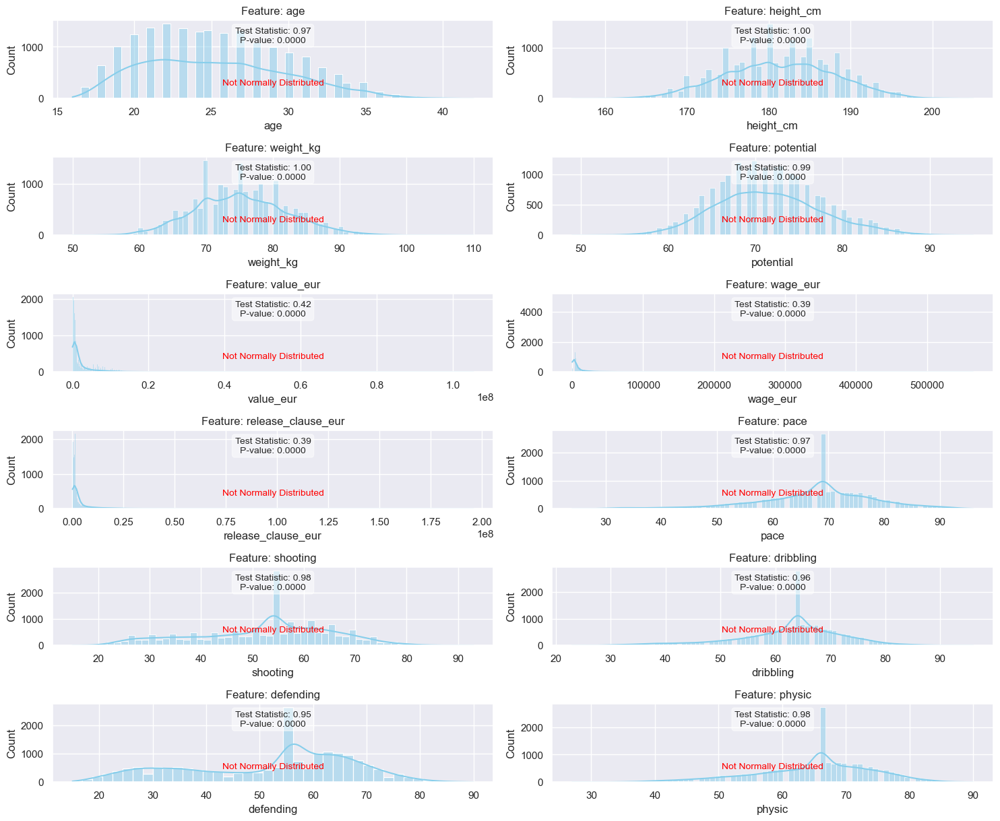

In [ ]:
import warnings
from scipy import stats

# Filter out the specific warning
warnings.filterwarnings("ignore", message="p-value may not be accurate for N > 5000.")

plt.figure(figsize=(15, 20))
num = 1

for column in out_cols:
    if num <= 20:
        plt.subplot(10, 2, num)

        # Plot histogram with KDE
        sns.histplot(data[column], kde=True, color='skyblue')
        plt.title(f'Feature: {column}')

        # Check for normality using Shapiro-Wilk test
        stat, p = stats.shapiro(data[column])
        plt.text(0.5, 0.8, f"Test Statistic: {stat:.2f}\nP-value: {p:.4f}",
                 transform=plt.gca().transAxes,
                 ha='center', va='center', fontsize=10,
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

        if p > 0.05:
            plt.text(0.5, 0.2, "Normally Distributed",
                     transform=plt.gca().transAxes,
                     ha='center', va='center', fontsize=10,
                     color='green')
        else:
            plt.text(0.5, 0.2, "Not Normally Distributed",
                     transform=plt.gca().transAxes,
                     ha='center', va='center', fontsize=10,
                     color='red')

        num = num + 1

plt.tight_layout()
plt.show()

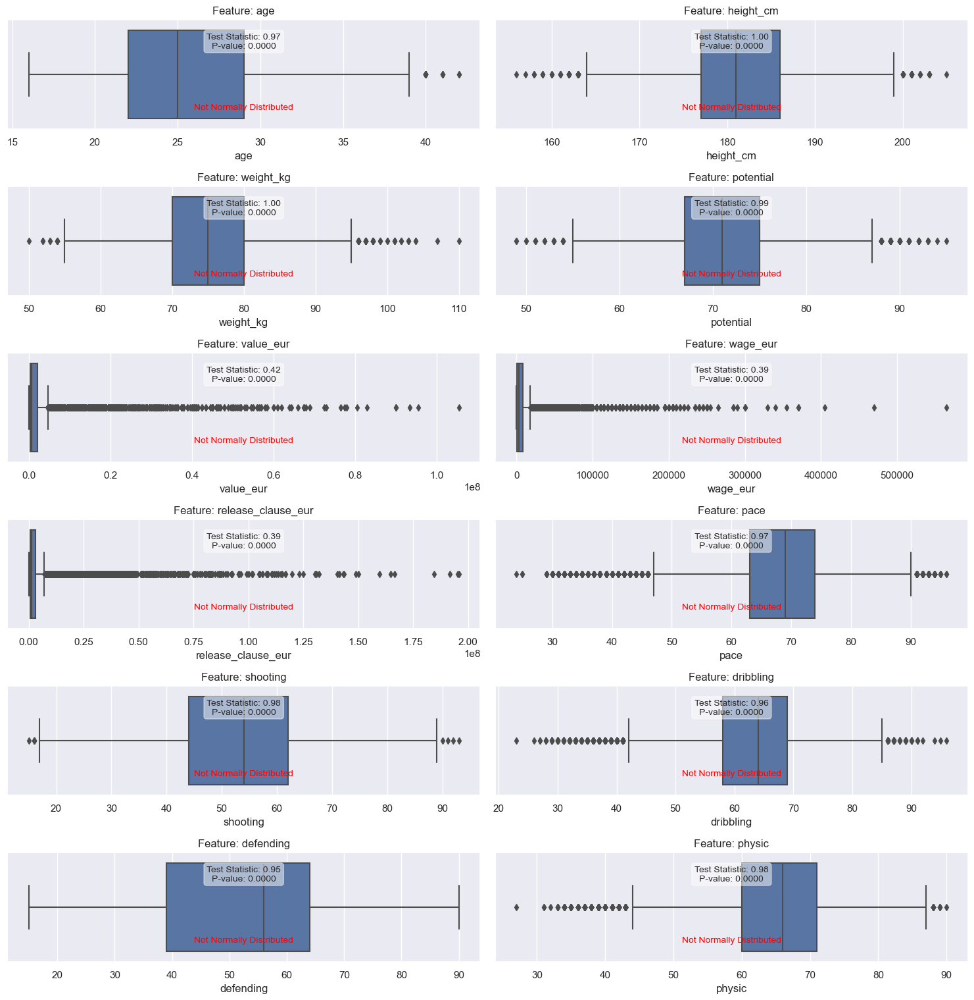

In [ ]:
# Filter out the specific warning
import warnings
from scipy import stats

#warnings.filterwarnings("ignore", message="p-value may not be accurate for N > 5000.")

plt.figure(figsize=(15, 25))
num = 1

for column in out_cols:
    if num <= 20:
        plt.subplot(10, 2, num)
        sns.boxplot(x=data[column])
        plt.title(f'Feature: {column}')

        # Check for normality using Shapiro-Wilk test
        stat, p = stats.shapiro(data[column])
        plt.text(0.5, 0.8, f"Test Statistic: {stat:.2f}\nP-value: {p:.4f}",
                 transform=plt.gca().transAxes,
                 ha='center', va='center', fontsize=10,
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

        if p > 0.05:
            plt.text(0.5, 0.2, "Normally Distributed",
                     transform=plt.gca().transAxes,
                     ha='center', va='center', fontsize=10,
                     color='green')
        else:
            plt.text(0.5, 0.2, "Not Normally Distributed",
                     transform=plt.gca().transAxes,
                     ha='center', va='center', fontsize=10,
                     color='red')

        num = num + 1

plt.tight_layout()
plt.show()


In [ ]:

num = 1

for column in out_cols:
    if num <= 20:
        # Identify and remove outliers using the median
        q1 = data[column].quantile(0.25)
        q3 = data[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        data[column] = data[column].apply(lambda x: x if lower_bound <= x <= upper_bound else data[column].median())

    num = num + 1

In [ ]:
data.head()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,AttackWorkRate,DefenseWorkRate
0,32.0,170.0,72.0,71.0,700000.0,3000.0,0,5,4,4,1200000.0,87.0,54.0,92.0,64.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,0.5,0.0
1,34.0,187.0,83.0,71.0,700000.0,3000.0,1,5,4,5,1200000.0,69.0,54.0,82.0,64.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,1.0,0.0
2,27.0,175.0,68.0,71.0,700000.0,3000.0,1,5,5,5,1200000.0,69.0,85.0,87.0,64.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,1.0,0.5
3,26.0,188.0,87.0,71.0,700000.0,3000.0,1,3,3,1,1200000.0,69.0,54.0,58.0,64.0,56.0,66.0,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0.5,0.5
4,28.0,175.0,74.0,71.0,700000.0,3000.0,1,4,4,4,1200000.0,69.0,83.0,86.0,64.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,1.0,0.5


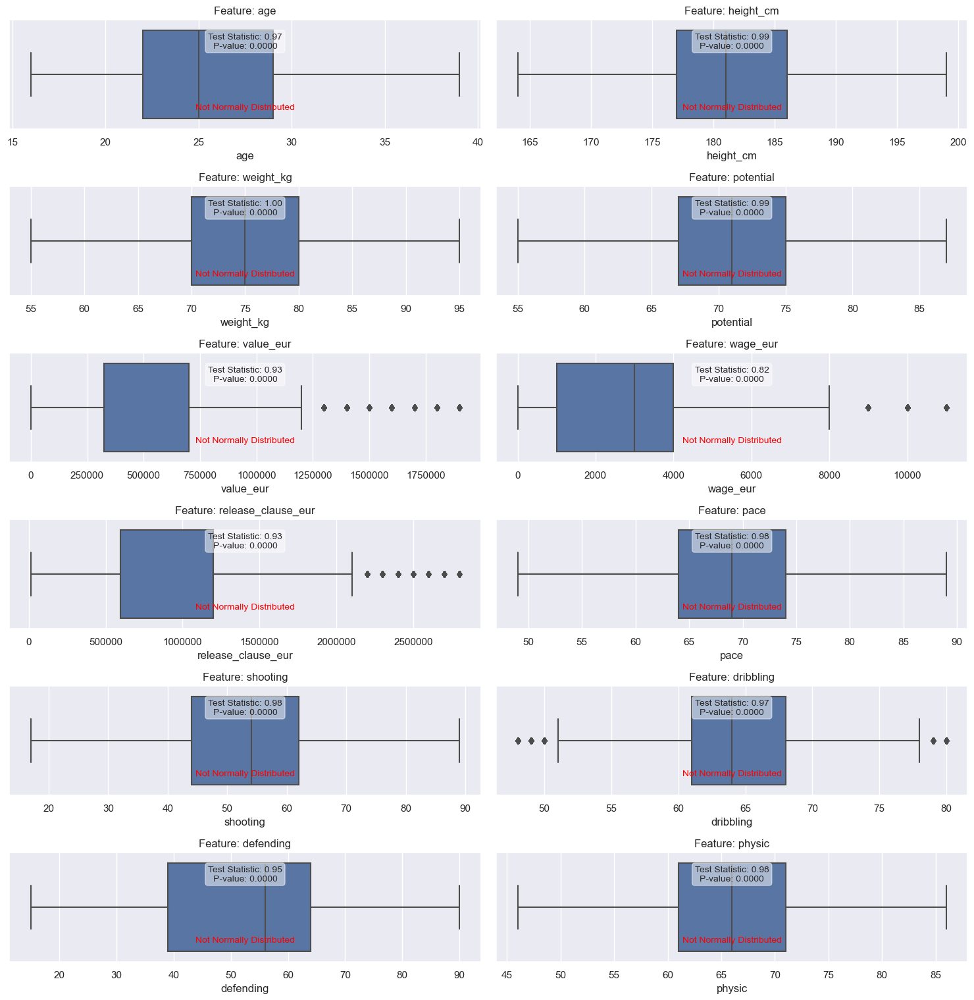

In [ ]:
plt.figure(figsize=(15, 25))
num = 1

for column in out_cols:
    if num <= 20:
        plt.subplot(10, 2, num)
        sns.boxplot(x=data[column])
        plt.title(f'Feature: {column}')

        # Check for normality using Shapiro-Wilk test
        stat, p = stats.shapiro(data[column])
        plt.text(0.5, 0.8, f"Test Statistic: {stat:.2f}\nP-value: {p:.4f}",
                 transform=plt.gca().transAxes,
                 ha='center', va='center', fontsize=10,
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

        if p > 0.05:
            plt.text(0.5, 0.2, "Normally Distributed",
                     transform=plt.gca().transAxes,
                     ha='center', va='center', fontsize=10,
                     color='green')
        else:
            plt.text(0.5, 0.2, "Not Normally Distributed",
                     transform=plt.gca().transAxes,
                     ha='center', va='center', fontsize=10,
                     color='red')

        num = num + 1

plt.tight_layout()
plt.show()


# SCALING

In [ ]:

# Standardize the numerical features (important for PCA)
scaler = StandardScaler()
data[['age', 'height_cm', 'weight_kg', 'potential', 'value_eur', 'wage_eur',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'release_clause_eur', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',
       'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'AttackWorkRate',
       'DefenseWorkRate']] = scaler.fit_transform(data[['age', 'height_cm', 'weight_kg', 'potential', 'value_eur', 'wage_eur',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'release_clause_eur', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',
       'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'AttackWorkRate',
       'DefenseWorkRate']])

In [ ]:
data.head()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,AttackWorkRate,DefenseWorkRate
0,1.453803,-1.721582,-0.465667,-0.075992,0.224863,-0.042051,-1.798048,10.285902,1.588459,2.133237,0.299159,2.231549,0.114309,3.533915,-0.029251,-0.839656,0.022747,2.089048,2.521670,1.020116,2.265238,2.552950,2.187351,2.479269,2.942162,2.573203,2.242225,1.775056,1.319040,1.991837,3.639424,2.193028,2.087565,0.257408,0.756079,0.220611,2.442165,-0.447066,-0.307108,2.241961,2.894270,1.694500,3.154006,-0.689317,-0.492949,-0.924093,-0.596066,-0.315057,-0.073010,-0.138191,-0.482875,-0.418305,-2.158629
1,1.885664,0.848702,1.130006,-0.075992,0.224863,-0.042051,0.556159,10.285902,1.588459,3.440398,0.299159,0.006331,0.114309,2.514934,-0.029251,-1.097045,1.521902,1.870766,2.470634,2.110319,1.652128,2.496457,1.764710,1.827892,1.909646,1.589341,2.003296,1.642094,1.790504,1.586650,3.748889,0.503026,2.762951,2.519902,1.380396,1.018411,2.390410,0.419101,-0.836584,2.292999,2.034379,2.331132,3.069835,-0.938188,-0.724591,-1.018357,-0.539688,-0.315057,-0.073010,-0.138191,-0.316556,1.506128,-2.158629
2,0.374151,-0.965616,-1.045913,-0.075992,0.224863,-0.042051,0.556159,10.285902,3.093037,3.440398,0.299159,0.006331,2.461209,3.024425,-0.029251,-1.290087,-0.976690,2.034477,2.113383,0.561083,1.924621,2.496457,2.134521,2.207862,2.540628,1.851704,2.182493,1.974500,1.655800,2.194431,3.311030,1.418444,1.637308,-0.329165,1.130669,-1.295210,1.924615,-0.273833,-0.499645,1.884700,2.607640,2.649447,2.985664,-0.987962,-1.002561,-0.782698,-0.426933,-0.432729,-0.073010,-0.079834,-0.316556,1.506128,-0.165327
3,0.158221,0.999895,1.710252,-0.075992,0.224863,-0.042051,0.556159,5.006771,0.083880,-1.788246,0.299159,0.006331,0.114309,0.069380,-0.029251,0.254249,0.022747,-2.003744,-1.765341,-2.135734,-1.072807,-1.684020,-2.303208,-1.863250,-1.646800,-0.837519,-1.700093,-1.416047,-0.297410,0.236027,2.873171,-1.046142,0.061408,1.095369,-1.366597,1.018411,-1.801743,-1.255488,-1.317926,-1.994140,0.816199,-2.379943,0.797206,-0.987962,-1.651158,-1.301147,3.970509,4.450641,3.719153,4.296909,4.007736,-0.418305,-0.165327
4,0.590081,-0.965616,-0.175545,-0.075992,0.224863,-0.042051,0.556159,7.646337,1.588459,2.133237,0.299159,0.006331,2.309796,2.922527,-0.029251,-1.097045,0.022747,1.707054,1.960276,0.503704,2.060868,2.270485,2.081691,1.936455,2.081732,1.982886,2.122760,1.974500,1.588448,2.126900,3.092100,2.122611,1.787394,-0.748145,1.317964,-0.178289,1.717595,-0.100599,-0.258974,1.884700,2.535982,2.522121,2.733149,-0.639543,-0.956233,-1.112620,-0.314178,-0.256221,-0.614748,-0.488330,-0.482875,1.506128,-0.165327


# PCA

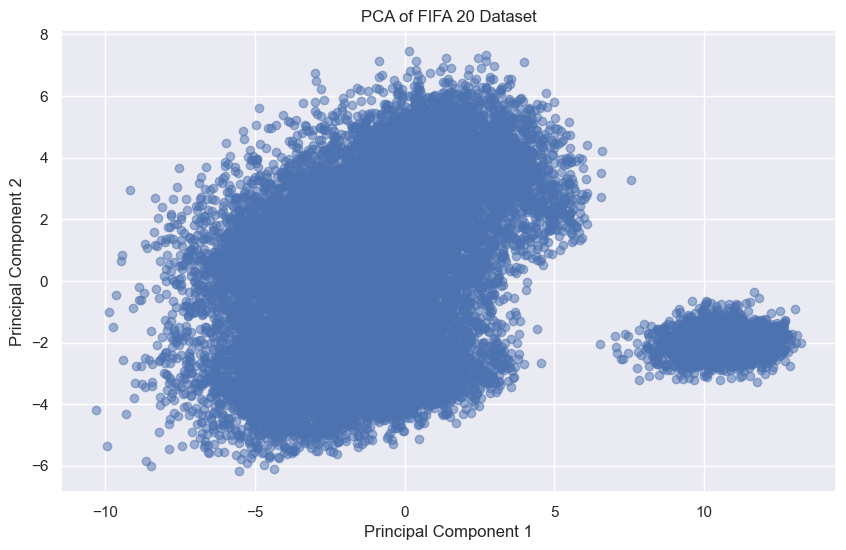

Explained Variance Ratios: [0.39485994 0.13979883]


In [ ]:
# Perform PCA with a specified number of components (e.g., 2 for visualization)
n_components = 2
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(data)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Add any additional columns or labels for analysis (e.g., player names, positions, etc.)

# Visualize the results (for 2D PCA)
plt.figure(figsize=(10, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of FIFA 20 Dataset')
plt.grid(True)
plt.show()

# You can analyze the explained variance to determine how many components to keep
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratios:", explained_variance)

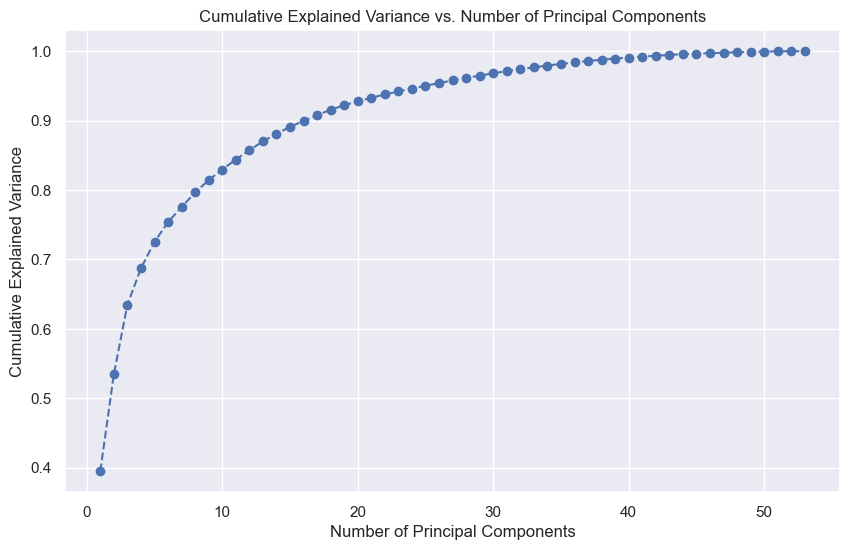

Number of components to retain for 0.95 variance: 25


In [ ]:
pca = PCA()
principal_components = pca.fit_transform(data)

# Explained variance ratios
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Visualize explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs. Number of Principal Components')
plt.grid(True)
plt.show()

# Determine the number of components to retain based on explained variance
desired_variance = 0.95  # Set your desired explained variance threshold
num_components_to_retain = np.argmax(cumulative_explained_variance >= desired_variance) + 1
print(f"Number of components to retain for {desired_variance} variance: {num_components_to_retain}")


# KMEANS CLUSTERING

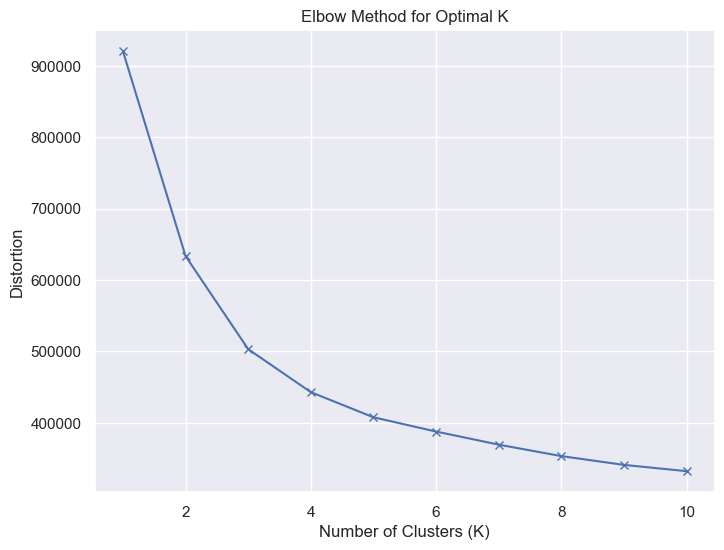

In [ ]:
from sklearn.cluster import KMeans
n_components = 25
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(data)

# Calculate the distortion for a range of cluster numbers
distortions = []
K = range(1, 11)  # You can adjust the range based on your problem
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca)
    distortions.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(K, distortions, 'bx-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.title('Elbow Method for Optimal K')
plt.grid(True)
plt.show()

In [ ]:
# selecting 2 clusters

In [ ]:
n_clusters = 2  # Specify the number of clusters based on your analysis
kmeans = KMeans(n_clusters=n_clusters, random_state=42,n_init=10)
cluster_labels = kmeans.fit_predict(X_pca)


In [ ]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(X_pca, cluster_labels)
print(f"Silhouette Score for n_clusters = 2: {silhouette_avg}")

Silhouette Score for n_clusters = 2: 0.4397345354803394


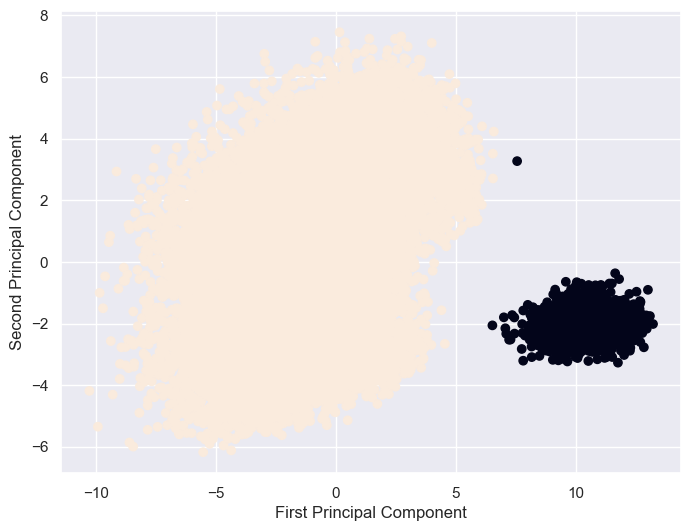

In [ ]:
plt.figure(figsize =(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c =cluster_labels)
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

In [ ]:
n_clusters = 3  # Specify the number of clusters based on your analysis
kmeans = KMeans(n_clusters=n_clusters, random_state=42,n_init=10)
cluster_labels = kmeans.fit_predict(X_pca)


In [ ]:
silhouette_avg = silhouette_score(X_pca, cluster_labels)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.23278483698596317


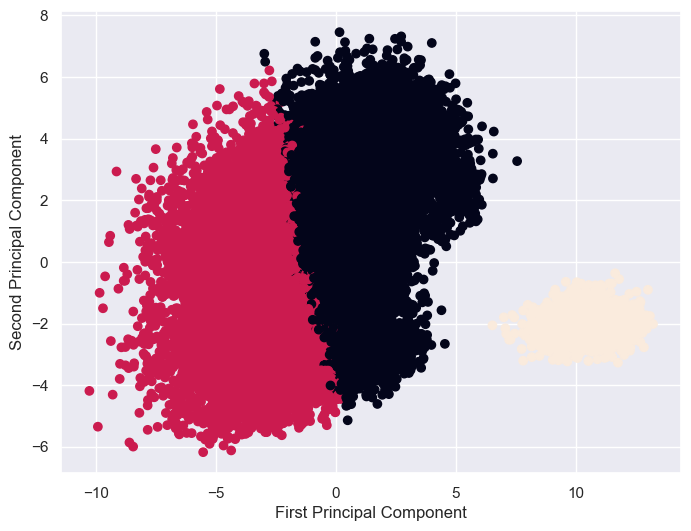

In [ ]:
plt.figure(figsize =(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c =cluster_labels)
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

for n_clusters=3,silhouette score =0.4397

# Hierarchial clustering

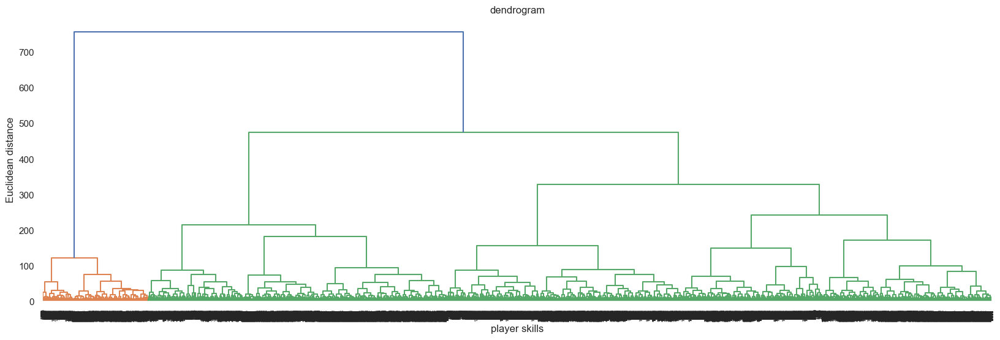

In [ ]:
import scipy.cluster.hierarchy as sch
plt.figure(figsize = (20, 6))
dendrogram=sch.dendrogram(sch.linkage(X_pca,method='ward'))
plt.title('dendrogram')
plt.xlabel('player skills')
plt.ylabel('Euclidean distance')
plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 2 , affinity = "euclidean" , linkage = "ward")

cluster_labels = hc.fit_predict(X_pca)

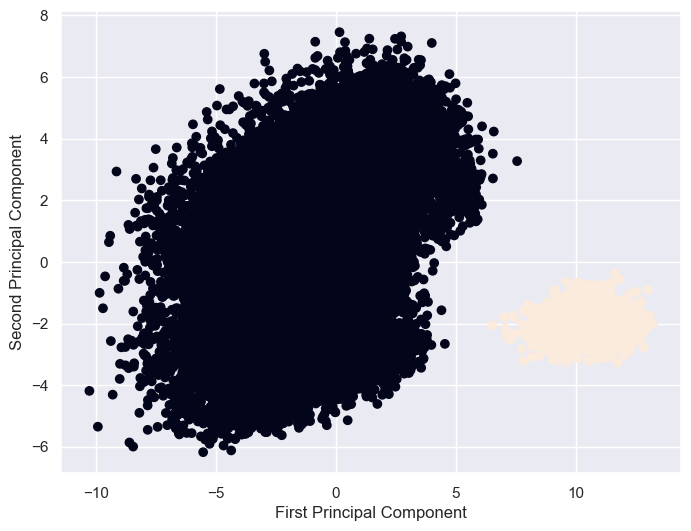

In [ ]:
plt.figure(figsize =(8, 6))
plt.scatter(X_pca[:, 0],X_pca[:, 1], c =cluster_labels)
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

In [ ]:
silhouette_avg = silhouette_score(X_pca, cluster_labels)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.43975993465447405


<h1><u>Challenges faced</u> </h1>

<h3>Data Cleaning and Preprocessing:</h3>
<h4>1. Handling Missing Data:</h4>

<ul>
    <li>Imputation: Replacing missing values with estimated values based on statistical methods.</li>
   
</ul>

<h4>2. Data Types:</h4>

<ul>
    <li>Converting Strings to Numerical Values: Transforming text data to numeric format for analysis, which often includes encoding categorical variables.</li>
    <li>Checking Data Types: Ensuring that variables are correctly assigned as integers, floats, or other appropriate data types.</li>
</ul>

<h4>3. Outliers:</h4>

<ul>
    <li>Identifying Outliers: Using statistical methods or visualization to detect data points that are far from the central tendency.</li>
    <li>Handling Outliers: Applying robust statistical techniques to remove the outliers</li>
</ul>

<h4>Categorical Data:</h4>
<p>Handling categorical data, such as player positions or club names, is essential for analysis. Techniques may include encoding, one-hot encoding, or using category embeddings.</p>

<h4>Feature Engineering:</h4>
<p>Feature engineering involves creating meaningful derived features or aggregations from existing data to improve analysis and model performance.</p>

<h4>Dimensionality Reduction:</h4>
<p>Dimensionality reduction techniques like PCA (Principal Component Analysis) can help reduce the complexity of the dataset for easier visualization and analysis.</p>

<h4>Clustering Challenges:</h4>
<p>Challenges in clustering analysis include determining the optimal number of clusters (e.g., using KMeans) and interpreting and validating the quality of the resulting clusters.</p>

<h4>Visualization:</h4>
<p>Creating informative visualizations is crucial for presenting insights effectively and aiding in data exploration.</p>

<h4>Statistical Analysis:</h4>
<p>Statistical analysis involves exploring relationships between attributes, dealing with multicollinearity, and drawing meaningful conclusions from the data.</p>

<h4>Machine Learning:</h4>
<p>Machine learning techniques can be applied to build predictive models for tasks like player rating prediction or position prediction.</p>

<h4>Domain Knowledge:</h4>
<p>Understanding soccer terminology, player positions, and game mechanics is essential for accurate data interpretation.</p>

<h4>Data Privacy and Ethics:</h4>
<p>Compliance with privacy regulations and ethical considerations is crucial, especially when handling sensitive data.</p>

<h4>Performance Optimization:</h4>
<p>Optimizing code and algorithms is essential for better performance, particularly when dealing with large datasets.</p>

<h4>Interpreting Results:</h4>
<p>Ensuring that analysis results are interpretable and actionable is key to deriving meaningful insights.</p>


<h1><u>Techniques</u> </h1>

<h4>Data Cleaning and Preprocessing:</h4>
<ul>
    <li><strong>Handling Missing Data:</strong> Impute or remove missing values from the dataset.</li>
    <li><strong>Encoding Categorical Data:</strong> Convert categorical variables into numerical format using techniques like one-hot encoding or label encoding.</li>
    <li><strong>Outlier Detection and Treatment:</strong> Identify and handle outliers that can affect analysis.</li>
</ul>

<h4>Descriptive Statistics:</h4>
<ul>
    <li><strong>Calculate summary statistics</strong> (mean, median, standard deviation, etc.) for numerical attributes to understand data distributions.</li>
    <li>Generate <strong>frequency tables and histograms</strong> for categorical attributes.</li>
</ul>

<h4>Data Visualization:</h4>
<ul>
    <li>Create various types of plots and charts, including <strong>scatter plots, bar charts, box plots, and heatmaps,</strong> to visualize relationships and patterns in the data.</li>
    <li>Visualize player attributes, team performance, or other relevant insights.</li>
</ul>

<h4>Correlation Analysis:</h4>
<ul>
    <li>Compute <strong>correlation matrices</strong> to identify relationships between numerical attributes.</li>
    <li>Use <strong>correlation heatmaps</strong> to visualize the strength and direction of correlations.</li>
</ul>

<h4>Dimensionality Reduction:</h4>
<ul>
    <li>Apply dimensionality reduction techniques like <strong>Principal Component Analysis (PCA)</strong> to reduce the number of attributes while preserving key information.</li>
    <li>Visualize the dataset in a lower-dimensional space to identify clusters or patterns.</li>
</ul>

<h4>Clustering Analysis:</h4>
<ul>
    <li>Use clustering algorithms such as <strong>KMeans</strong> to group players or teams based on their attributes.</li>
    <li>Evaluate the quality of clusters using metrics like <strong>Silhouette Score.</strong></li>
</ul>

<h4>Statistical Analysis:</h4>
<ul>
    <li>Perform <strong>hypothesis testing</strong> to make inferences about the data.</li>
    <li>Analyze the relationships between attributes, such as the impact of age on player ratings.</li>
</ul>

<h4>Machine Learning:</h4>
<ul>
    <li>Train machine learning models for tasks like <strong>player rating prediction, position prediction, or team performance forecasting.</strong></li>
    <li>Perform <strong>feature selection</strong> to identify the most important attributes for prediction.</li>
</ul>

<h4>Scaling:</h4>
<ul>
    <li>PCA is sensitive to the relative scales of the variables, so scaling helps ensure that all variables contribute equally to the analysis.</li>
    <li>Perform <strong>Standardization scales</strong>`m on the datasets</li>
    <li>Perform PCA on the scaled data to reduce dimensionality while preserving the variance of the original data.</li>
   
</ul>
<h4>Elbow Method:</h4>

<ul>
<li>The Elbow method was employed to determine the optimal number of clusters (K) for K-means.</li>
<li>The Sum of Squared Distances (inertia) for a range of K values was calculated and plotted.</li>
</ul>

<h1>Model Comparison Report
</h1>

<h3>K-means Clustering:</h3>
<ul>
<li>K-means clustering was applied to the PCA-transformed data for a range of K values.</li>
<li>Silhouette Score, a metric that measures cluster separation and cohesion, was used to evaluate clustering quality.</li>
</ul>

<h4>Results:</h4>

<p>The best Silhouette Score achieved: 0.4397.</p>


<h3>Interpretation:</h3>
    
<h4>The Silhouette Score:</h4>
<p>The Silhouette Score measures how well-separated the clusters are. A higher score indicates better-defined clusters.</p>

<h4>A Silhouette Score of 0.4397:</h4>
<p>A Silhouette Score of <strong>0.4397</strong> suggests <strong>moderate cluster separation,</strong> but it may indicate that the data is not highly conducive to clustering with K-means.</p>


<h4>The Elbow Method:</h4>
<p>The absence of a clear <strong>"elbow"</strong> point in the Elbow method plot indicates uncertainty when determining the optimal number of clusters. This means that there is no distinct point where the inertia sharply decreases, making it challenging to select the most appropriate number of clusters.</p>
